In [ ]:
!ls -lh /content/ModelNet10.zip
!unzip /content/ModelNet10.zip -d /content/
!rm -rf /content/_MACOSX

Utdata för streaming har trunkerats till de sista 5000 raderna.
  inflating: /content/ModelNet10/monitor/test/monitor_0558.off  
  inflating: /content/__MACOSX/ModelNet10/monitor/test/._monitor_0558.off  
  inflating: /content/ModelNet10/monitor/test/monitor_0559.off  
  inflating: /content/__MACOSX/ModelNet10/monitor/test/._monitor_0559.off  
  inflating: /content/ModelNet10/monitor/test/monitor_0560.off  
  inflating: /content/__MACOSX/ModelNet10/monitor/test/._monitor_0560.off  
  inflating: /content/ModelNet10/monitor/test/monitor_0561.off  
  inflating: /content/__MACOSX/ModelNet10/monitor/test/._monitor_0561.off  
  inflating: /content/ModelNet10/monitor/test/monitor_0562.off  
  inflating: /content/__MACOSX/ModelNet10/monitor/test/._monitor_0562.off  
  inflating: /content/ModelNet10/monitor/test/monitor_0563.off  
  inflating: /content/__MACOSX/ModelNet10/monitor/test/._monitor_0563.off  
  inflating: /content/ModelNet10/monitor/test/monitor_0564.off  
  inflating: /content/__M

In [ ]:
!pip install trimesh
!pip install rtree
!pip install tqdm
!pip install chamferdist
!git clone https://github.com/Colin97/MSN-Point-Cloud-Completion.git
%cd MSN-Point-Cloud-Completion
!git submodule update --init --recursive
%cd emd
!python setup.py install


DEPRECATION: Loading egg at /usr/local/lib/python3.11/dist-packages/emd-0.0.0-py3.11-linux-x86_64.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at /usr/local/lib/python3.11/dist-packages/emd-0.0.0-py3.11-linux-x86_64.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at /usr/local/lib/python3.11/dist-packages/emd-0.0.0-py3.11-linux-x86_64.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at /usr/local/lib/python3.11/dist-packages/emd-0.0.0-py3.11-linux-x86_64.egg is deprecated. pip 

In [ ]:
def sample_points_from_mesh(mesh, num_points=1024):
    points = mesh.sample(num_points)
    return points


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import trimesh
import torch.utils.data as data
import numpy as np
import os


class MinimalPointNet(nn.Module):
    def __init__(self, num_classes=10):
        super(MinimalPointNet, self).__init__()
        self.conv1 = nn.Conv1d(3, 64, 1)
        self.conv2 = nn.Conv1d(64, 128, 1)
        self.conv3 = nn.Conv1d(128, 1024, 1)

        self.bn1 = nn.BatchNorm1d(64)
        self.bn2 = nn.BatchNorm1d(128)
        self.bn3 = nn.BatchNorm1d(1024)

        self.fc1 = nn.Linear(1024, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, num_classes)

        self.bn4 = nn.BatchNorm1d(512)
        self.bn5 = nn.BatchNorm1d(256)

        self.dropout = nn.Dropout(p=0.3)

    def forward(self, x):

        x = x.transpose(1, 2)

        x = F.relu(self.bn1(self.conv1(x)))
        x = F.relu(self.bn2(self.conv2(x)))
        x = F.relu(self.bn3(self.conv3(x)))

        x = torch.max(x, 2, keepdim=False)[0]  # [B, 1024]

        x = F.relu(self.bn4(self.fc1(x)))
        x = self.dropout(x)
        x = F.relu(self.bn5(self.fc2(x)))
        x = self.dropout(x)
        x = self.fc3(x)

        return x

import torch
import torch.nn as nn
import torch.nn.functional as F


class PointCloudAE(nn.Module):
    def __init__(self, point_size=1024, latent_size=256):
        super(PointCloudAE, self).__init__()

        self.latent_size = latent_size
        self.point_size = point_size

        self.conv1 = torch.nn.Conv1d(3, 64, 1)
        self.conv2 = torch.nn.Conv1d(64, 128, 1)
        self.conv3 = torch.nn.Conv1d(128, self.latent_size, 1)

        self.bn1 = nn.BatchNorm1d(64)
        self.bn2 = nn.BatchNorm1d(128)
        self.bn3 = nn.BatchNorm1d(self.latent_size)

        self.dec1 = nn.Linear(self.latent_size, 512)
        self.dec2 = nn.Linear(512, 1024)
        self.dec3 = nn.Linear(1024, self.point_size * 3)

    def encoder(self, x):
        x = x.transpose(1, 2)
        x = F.relu(self.bn1(self.conv1(x)))
        x = F.relu(self.bn2(self.conv2(x)))
        x = self.bn3(self.conv3(x))

        x = torch.max(x, 2, keepdim=True)[0]
        x = x.view(-1, self.latent_size)
        return x

    def decoder(self, x):
        x = F.relu(self.dec1(x))
        x = F.relu(self.dec2(x))
        x = self.dec3(x)

        return x.view(-1, self.point_size, 3)

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


class PointCloudDataset(data.Dataset):
    def __init__(self, data_dir, mode, num_points=1024):
        self.data_dir = data_dir
        self.num_points = num_points
        self.mode = mode
        self.classes = sorted([
            d for d in os.listdir(data_dir)
            if os.path.isdir(os.path.join(data_dir, d))
        ])


        self.data = []
        self.labels = []


        for label, class_name in enumerate(self.classes):
            print(label)

            class_dir = os.path.join(data_dir,class_name)
            if os.path.isdir(class_dir):
                train_dir = os.path.join(class_dir,mode)
                for file in os.listdir(train_dir):
                    if file.endswith('.off'):
                        file_path = os.path.join(train_dir,file)
                        mesh = trimesh.load_mesh(file_path)
                        points = sample_points_from_mesh(mesh, self.num_points)

                        points = points - np.mean(points, axis=0)
                        scale = np.max(np.linalg.norm(points, axis=1))
                        points = points / scale

                        self.data.append(points)
                        self.labels.append(label)

    def __len__(self):
        return len(self.data)

    def __getitem__(self,idx):
        point_cloud = np.array(self.data[idx], dtype=np.float32)
        label = self.labels[idx]
        return torch.tensor(point_cloud,dtype=torch.float32), torch.tensor(label,dtype=torch.long)

class PointCloudEncoderDataset(data.Dataset):
    def __init__(self, data_dir, mode, num_points=1024, class_id=None):
        self.data_dir = data_dir
        self.num_points = num_points
        self.mode = mode
        self.class_id = class_id
        self.classes = sorted([
            d for d in os.listdir(data_dir)
            if os.path.isdir(os.path.join(data_dir, d))
        ])

        self.data = []
        self.labels = []

        for label, class_name in enumerate(self.classes):
            if self.class_id is not None and label != self.class_id:
                continue

            print(f"Loading class {class_name}")

            class_dir = os.path.join(data_dir, class_name)
            if os.path.isdir(class_dir):
                train_dir = os.path.join(class_dir, mode)
                for file in os.listdir(train_dir):
                    if file.endswith('.off'):
                        file_path = os.path.join(train_dir, file)
                        mesh = trimesh.load_mesh(file_path)
                        points = sample_points_from_mesh(mesh, self.num_points)

                        points = points - np.mean(points, axis=0)
                        scale = np.max(np.linalg.norm(points, axis=1))
                        points = points / scale

                        self.data.append(points)
                        self.labels.append(label)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        point_cloud = np.array(self.data[idx], dtype=np.float32)
        label = self.labels[idx]
        return torch.tensor(point_cloud, dtype=torch.float32), torch.tensor(label, dtype=torch.long)


In [ ]:
data_dir = 'ModelNet10'
num_points = 1024

print("Creating Dataset and dataloader...")
train_dataset = PointCloudDataset(data_dir, mode='train', num_points=num_points)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64,shuffle=True)

test_dataset = PointCloudDataset(data_dir, mode='test', num_points=num_points)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=32,shuffle=False)

Creating Dataset and dataloader...
0
1


KeyboardInterrupt: 

In [ ]:
class_id = 2
train_dataset = PointCloudEncoderDataset(data_dir=data_dir, mode="train", class_id=class_id)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)

test_dataset = PointCloudEncoderDataset(data_dir=data_dir, mode="test", class_id=class_id)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=32, shuffle=False)

Loading class chair
Loading class chair


In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def visualize_point_cloud(points, title="Point Cloud"):
    """
    Visualize a single point cloud

    Args:
        points: numpy array of shape (N, 3)
        title: title for the plot
    """
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')

    ax.scatter(points[:, 0], points[:, 1], points[:, 2], s=1)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

    plt.tight_layout()
    plt.show()


sample_point_cloud, sample_label = next(iter(train_loader))

points = sample_point_cloud[0].numpy()

classes = ['bathtub', "bed","chair", "desk", "dresser", "monitor", "night_stand", "sofa", "table", "toilet"]
print(classes[sample_label[0]])
visualize_point_cloud(points, "Original Point Cloud")

NameError: name 'train_loader' is not defined

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import torch

def visualize_reconstruction(ground_truth, incomplete, reconstructed, idx=0):
    fig = plt.figure(figsize=(12, 4))

    def plot_subplot(points, title, subplot_idx):
        ax = fig.add_subplot(1, 3, subplot_idx, projection='3d')
        ax.scatter(points[:, 0], points[:, 1], points[:, 2], s=5)
        ax.set_title(title)
        ax.set_xlim(-1, 1)
        ax.set_ylim(-1, 1)
        ax.set_zlim(-1, 1)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_zticks([])

    plot_subplot(ground_truth, "Ground Truth", 1)
    plot_subplot(incomplete, "Incomplete", 2)
    plot_subplot(reconstructed, "Reconstructed", 3)

    plt.tight_layout()
    plt.show()


In [ ]:
print(len(train_loader))
print(train_loader)

28


In [ ]:
!pip show emd

DEPRECATION: Loading egg at /usr/local/lib/python3.11/dist-packages/emd-0.0.0-py3.11-linux-x86_64.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
Name: emd
Version: 0.0.0
Summary: 
Home-page: 
Author: 
Author-email: 
License: 
Location: /usr/local/lib/python3.11/dist-packages/emd-0.0.0-py3.11-linux-x86_64.egg
Requires: 
Required-by: 


In [ ]:
import sys
import os

egg_path = '/usr/local/lib/python3.11/dist-packages/emd-0.0.0-py3.11-linux-x86_64.egg'

egg_dir = os.path.dirname(egg_path)

if egg_dir not in sys.path:
    sys.path.insert(0, egg_dir)

if egg_path not in sys.path:
     sys.path.insert(0, egg_path)


print(f"Added {egg_dir} and {egg_path} to sys.path")
print("Updated sys.path:")
for path in sys.path:
    print(path)

Added /usr/local/lib/python3.11/dist-packages and /usr/local/lib/python3.11/dist-packages/emd-0.0.0-py3.11-linux-x86_64.egg to sys.path
Updated sys.path:
/usr/local/lib/python3.11/dist-packages/emd-0.0.0-py3.11-linux-x86_64.egg
/content
/env/python
/usr/lib/python311.zip
/usr/lib/python3.11
/usr/lib/python3.11/lib-dynload

/usr/local/lib/python3.11/dist-packages
/usr/lib/python3/dist-packages
/usr/local/lib/python3.11/dist-packages/IPython/extensions
/usr/local/lib/python3.11/dist-packages/setuptools/_vendor
/root/.ipython
/tmp/tmpb3nv20qb


In [ ]:
import time
import numpy as np
import torch
from torch import nn
from torch.autograd import Function
import emd




class emdFunction(Function):
    @staticmethod
    def forward(ctx, xyz1, xyz2, eps, iters):

        batchsize, n, _ = xyz1.size()
        _, m, _ = xyz2.size()

        assert(n == m)
        assert(xyz1.size()[0] == xyz2.size()[0])
        assert(n % 1024 == 0)
        assert(batchsize <= 512)

        xyz1 = xyz1.contiguous().float().cuda()
        xyz2 = xyz2.contiguous().float().cuda()
        dist = torch.zeros(batchsize, n, device='cuda').contiguous()
        assignment = torch.zeros(batchsize, n, device='cuda', dtype=torch.int32).contiguous() - 1
        assignment_inv = torch.zeros(batchsize, m, device='cuda', dtype=torch.int32).contiguous() - 1
        price = torch.zeros(batchsize, m, device='cuda').contiguous()
        bid = torch.zeros(batchsize, n, device='cuda', dtype=torch.int32).contiguous()
        bid_increments = torch.zeros(batchsize, n, device='cuda').contiguous()
        max_increments = torch.zeros(batchsize, m, device='cuda').contiguous()
        unass_idx = torch.zeros(batchsize * n, device='cuda', dtype=torch.int32).contiguous()
        max_idx = torch.zeros(batchsize * m, device='cuda', dtype=torch.int32).contiguous()
        unass_cnt = torch.zeros(512, dtype=torch.int32, device='cuda').contiguous()
        unass_cnt_sum = torch.zeros(512, dtype=torch.int32, device='cuda').contiguous()
        cnt_tmp = torch.zeros(512, dtype=torch.int32, device='cuda').contiguous()

        emd.forward(xyz1, xyz2, dist, assignment, price, assignment_inv, bid, bid_increments, max_increments, unass_idx, unass_cnt, unass_cnt_sum, cnt_tmp, max_idx, eps, iters)

        ctx.save_for_backward(xyz1, xyz2, assignment)
        return dist, assignment

    @staticmethod
    def backward(ctx, graddist, gradidx):
        xyz1, xyz2, assignment = ctx.saved_tensors
        graddist = graddist.contiguous()

        gradxyz1 = torch.zeros(xyz1.size(), device='cuda').contiguous()
        gradxyz2 = torch.zeros(xyz2.size(), device='cuda').contiguous()

        emd.backward(xyz1, xyz2, gradxyz1, graddist, assignment)
        return gradxyz1, gradxyz2, None, None

class emdModule(nn.Module):
    def __init__(self):
        super(emdModule, self).__init__()

    def forward(self, input1, input2, eps, iters):
        return emdFunction.apply(input1, input2, eps, iters)


In [ ]:
from chamferdist import ChamferDistance
import emd

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_points=1024
#model = PointCloudAE().cuda()
model = PointCloudAE(point_size=1024).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
''' scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', factor=0.5, patience=5, verbose=True
    ) '''
criterion = emdModule()
EMD_EPS = 0.05
EMD_ITERS = 100
#criterion = ChamferDistance()




Epoch [1/100]:   0%|          | 0/28 [00:00<?, ?it/s]

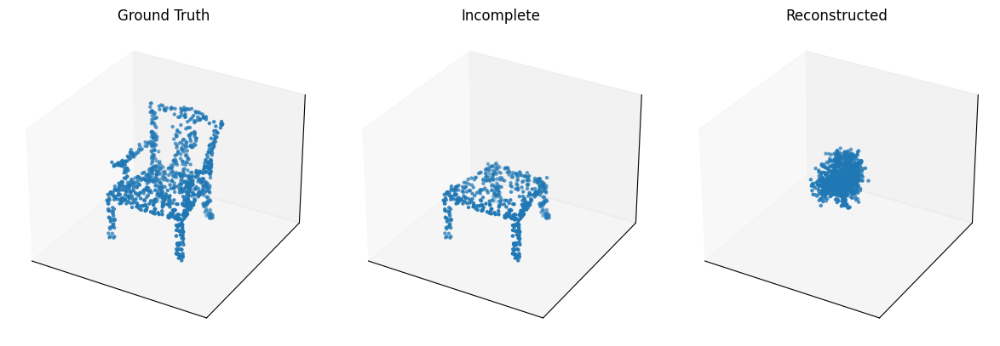

Epoch [1/100], Loss: 0.1472


Epoch [2/100]:   0%|          | 0/28 [00:00<?, ?it/s]

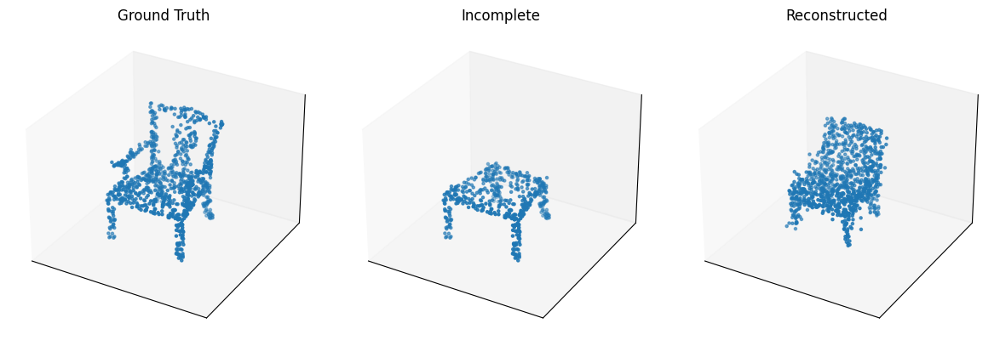

Epoch [2/100], Loss: 0.1268


Epoch [3/100]:   0%|          | 0/28 [00:00<?, ?it/s]

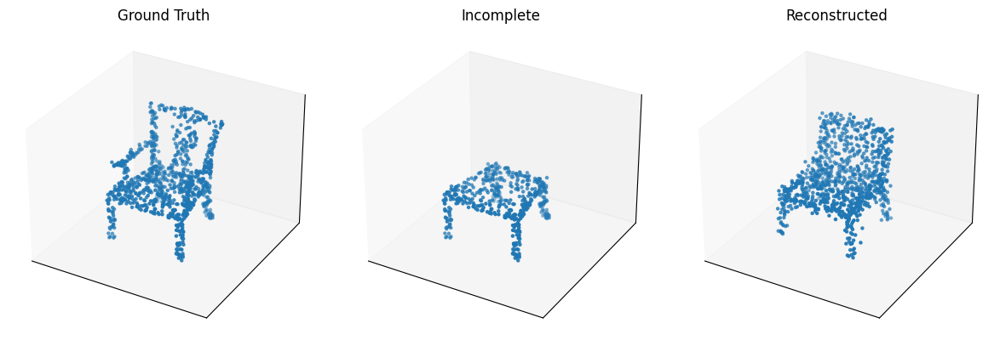

Epoch [3/100], Loss: 0.1175


Epoch [4/100]:   0%|          | 0/28 [00:00<?, ?it/s]

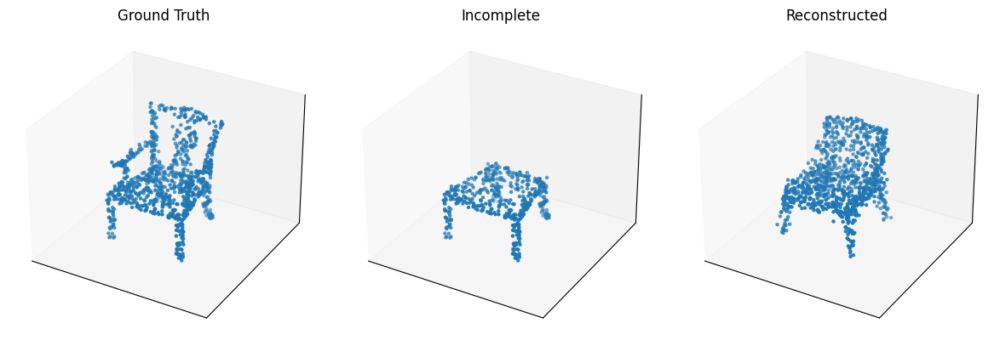

Epoch [4/100], Loss: 0.1132


Epoch [5/100]:   0%|          | 0/28 [00:00<?, ?it/s]

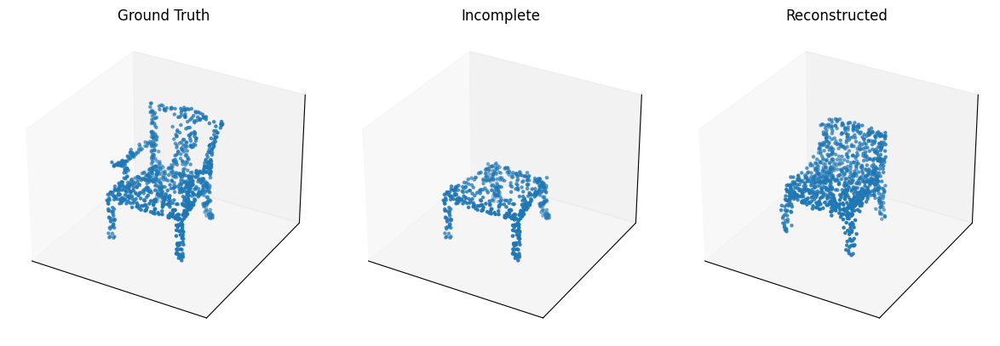

Epoch [5/100], Loss: 0.1102


Epoch [6/100]:   0%|          | 0/28 [00:00<?, ?it/s]

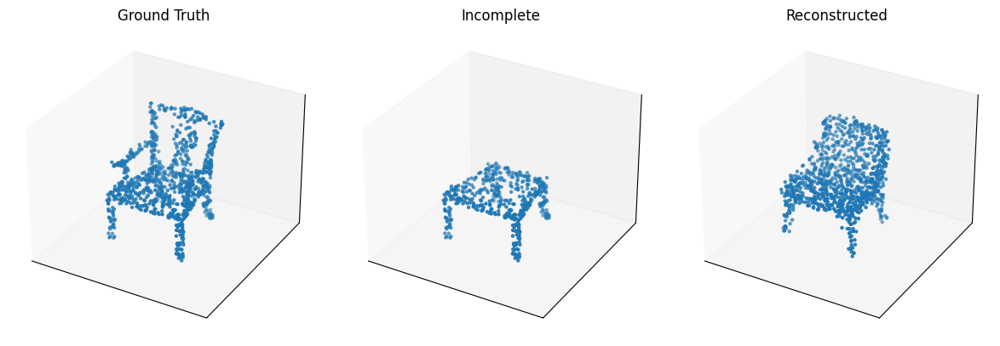

Epoch [6/100], Loss: 0.1089


Epoch [7/100]:   0%|          | 0/28 [00:00<?, ?it/s]

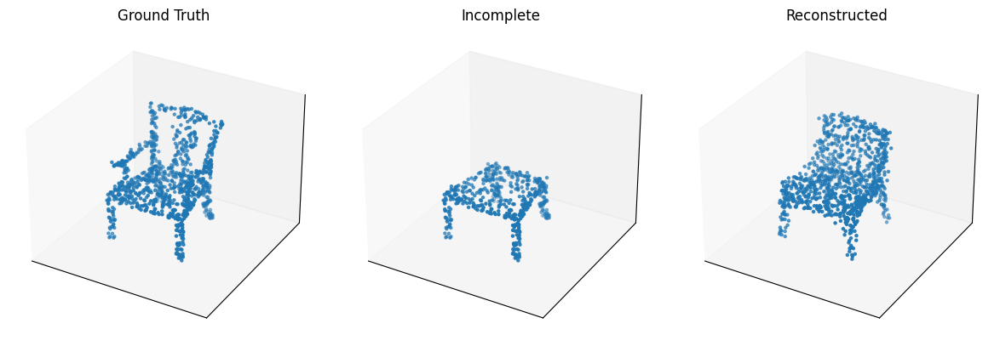

Epoch [7/100], Loss: 0.1060


Epoch [8/100]:   0%|          | 0/28 [00:00<?, ?it/s]

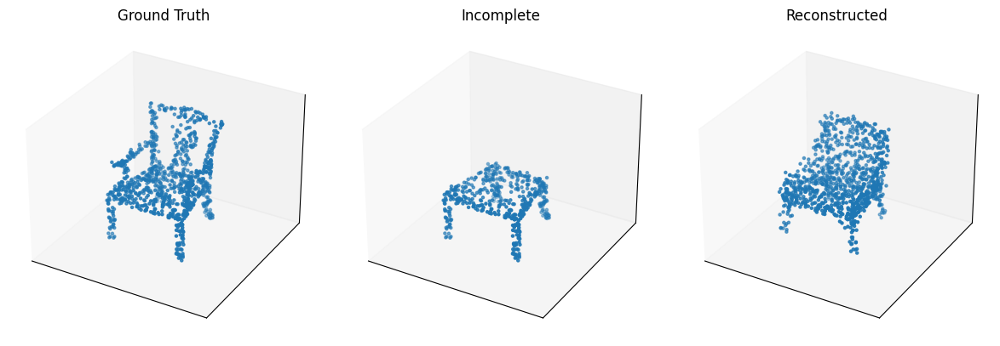

Epoch [8/100], Loss: 0.1052


Epoch [9/100]:   0%|          | 0/28 [00:00<?, ?it/s]

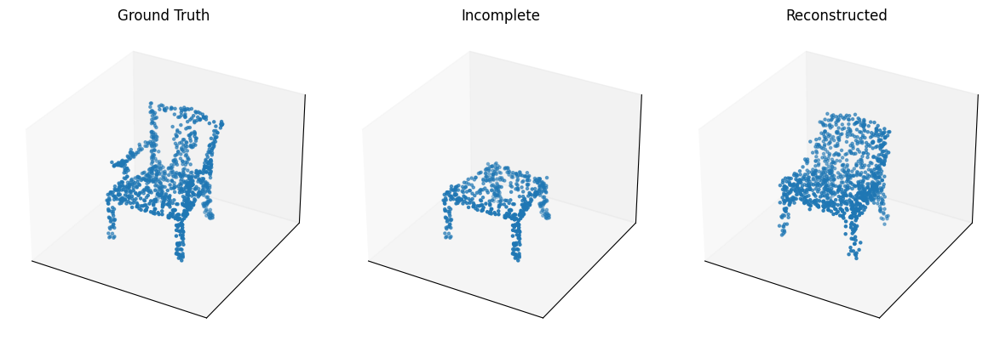

Epoch [9/100], Loss: 0.1050


Epoch [10/100]:   0%|          | 0/28 [00:00<?, ?it/s]

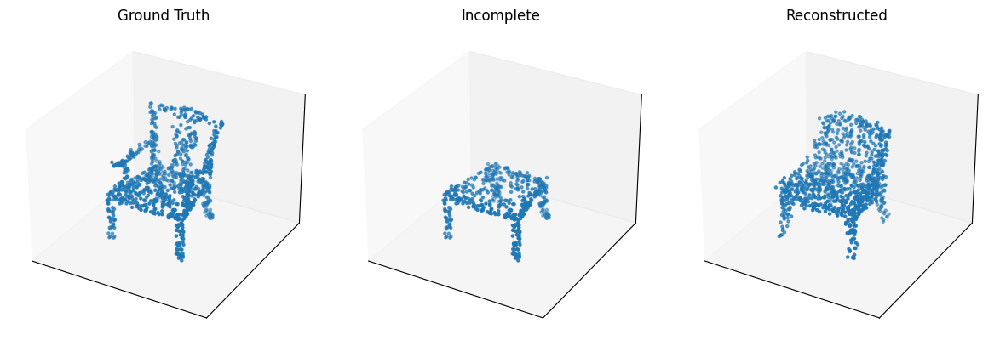

Epoch [10/100], Loss: 0.1029


Epoch [11/100]:   0%|          | 0/28 [00:00<?, ?it/s]

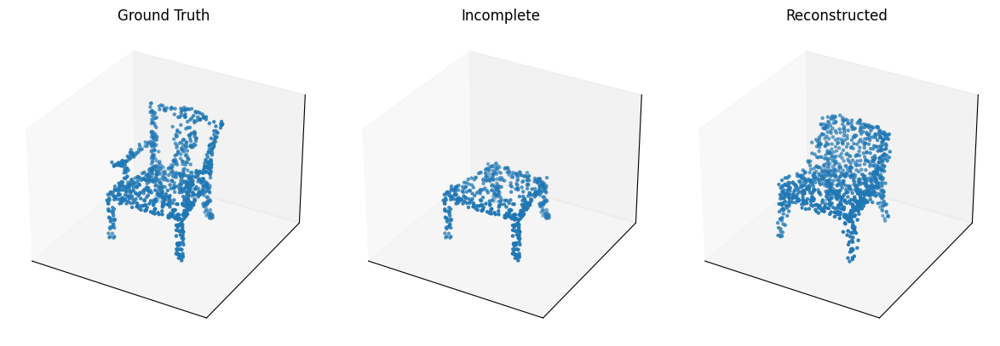

Epoch [11/100], Loss: 0.1009


Epoch [12/100]:   0%|          | 0/28 [00:00<?, ?it/s]

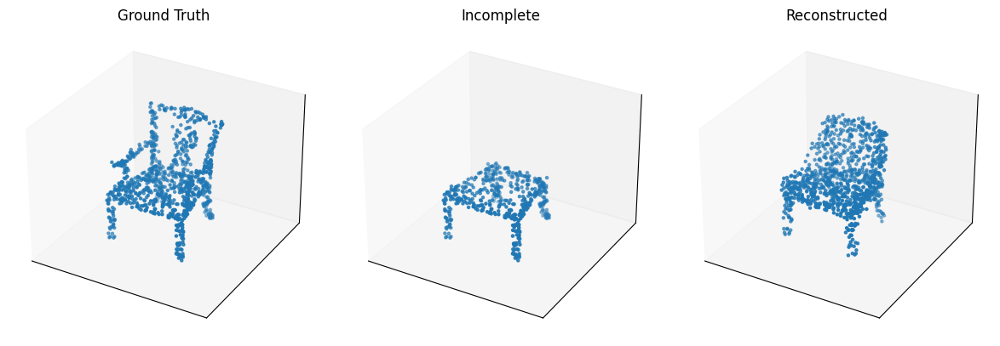

Epoch [12/100], Loss: 0.0996


Epoch [13/100]:   0%|          | 0/28 [00:00<?, ?it/s]

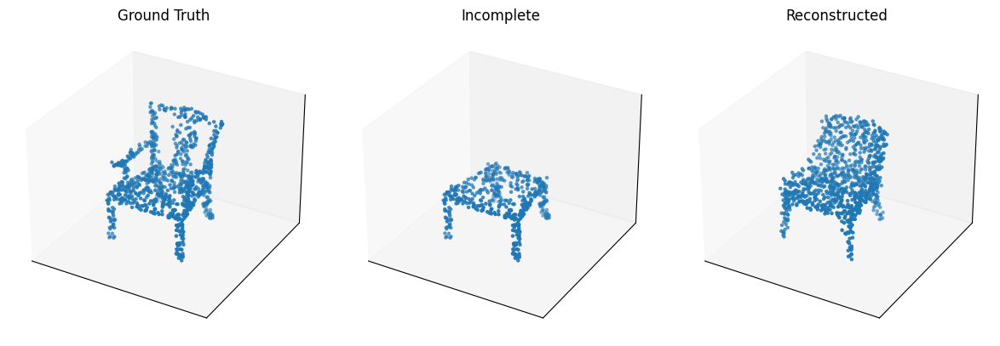

Epoch [13/100], Loss: 0.0992


Epoch [14/100]:   0%|          | 0/28 [00:00<?, ?it/s]

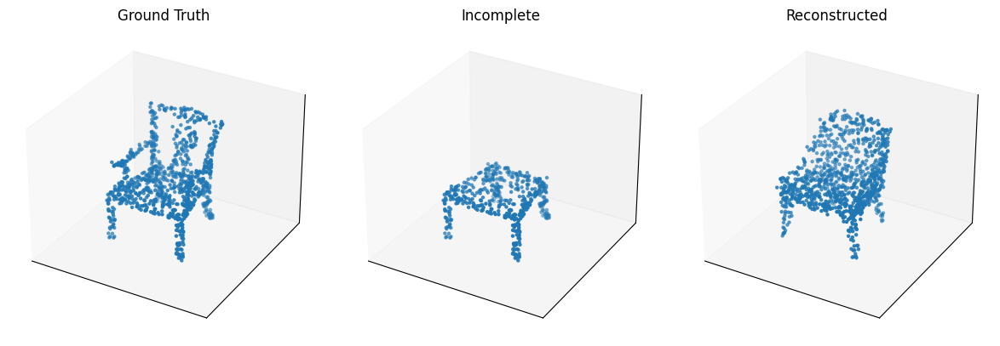

Epoch [14/100], Loss: 0.0984


Epoch [15/100]:   0%|          | 0/28 [00:00<?, ?it/s]

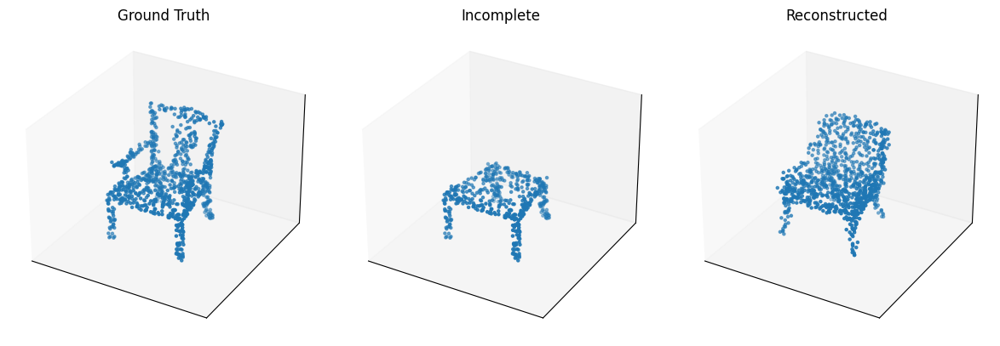

Epoch [15/100], Loss: 0.0980


Epoch [16/100]:   0%|          | 0/28 [00:00<?, ?it/s]

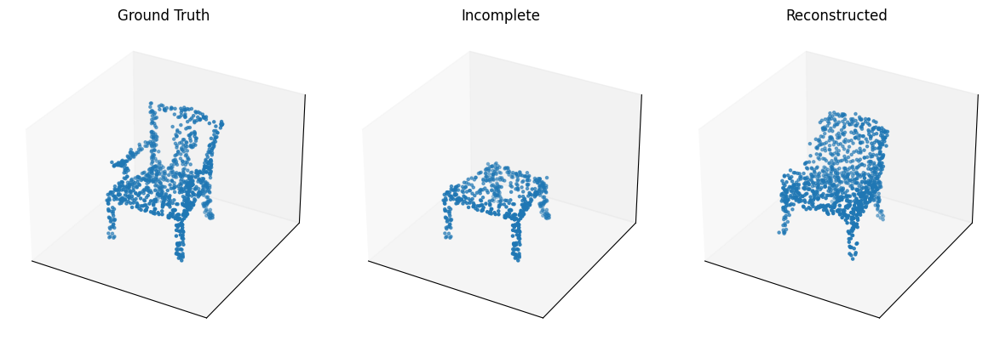

Epoch [16/100], Loss: 0.0963


Epoch [17/100]:   0%|          | 0/28 [00:00<?, ?it/s]

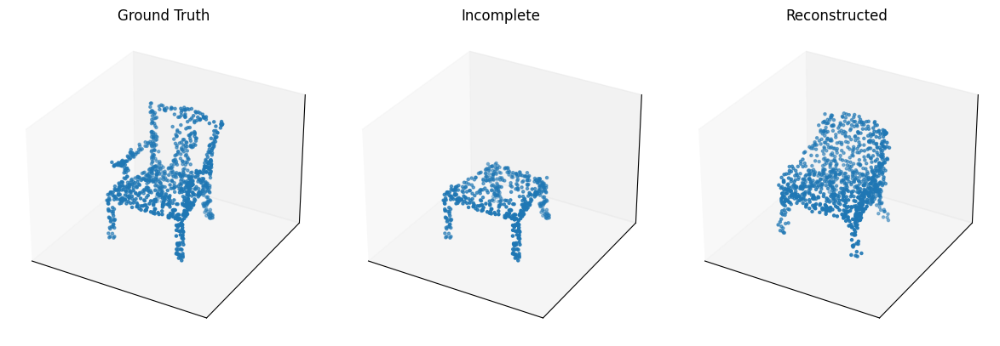

Epoch [17/100], Loss: 0.0960


Epoch [18/100]:   0%|          | 0/28 [00:00<?, ?it/s]

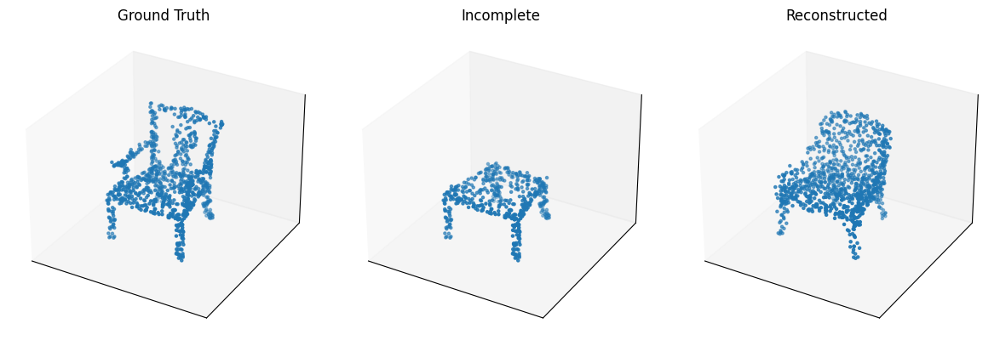

Epoch [18/100], Loss: 0.0954


Epoch [19/100]:   0%|          | 0/28 [00:00<?, ?it/s]

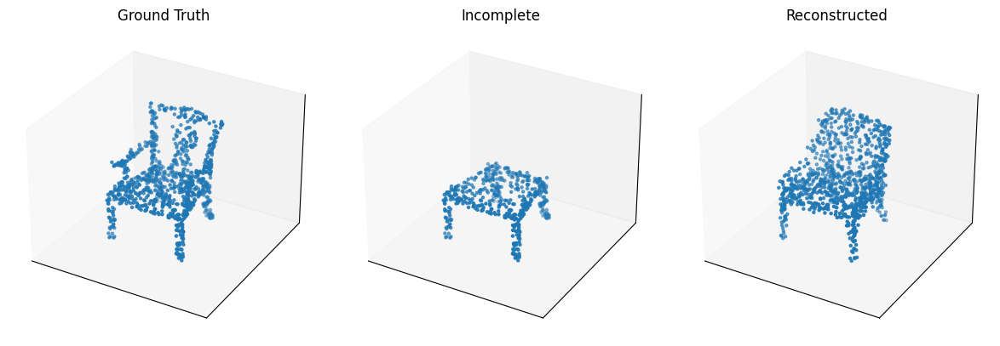

Epoch [19/100], Loss: 0.0961


Epoch [20/100]:   0%|          | 0/28 [00:00<?, ?it/s]

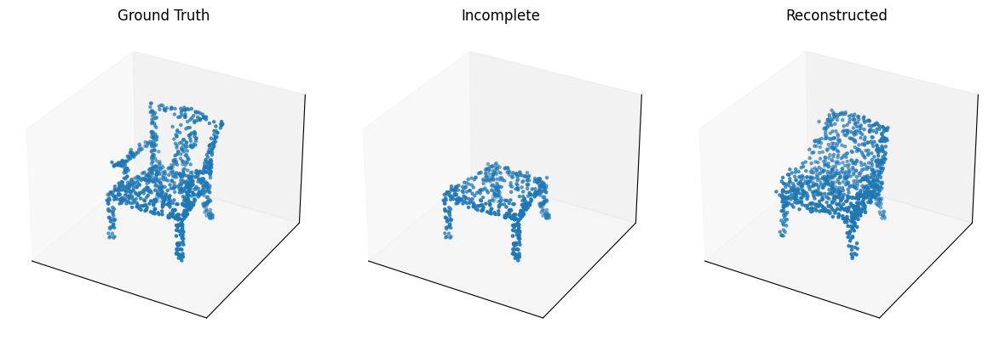

Epoch [20/100], Loss: 0.0937


Epoch [21/100]:   0%|          | 0/28 [00:00<?, ?it/s]

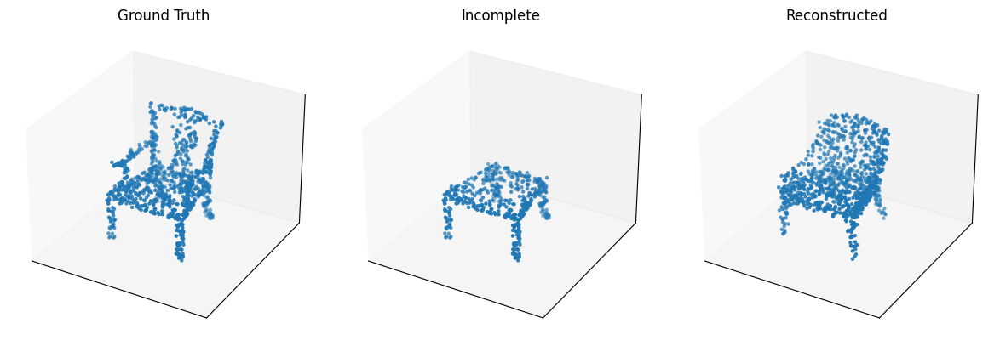

Epoch [21/100], Loss: 0.0927


Epoch [22/100]:   0%|          | 0/28 [00:00<?, ?it/s]

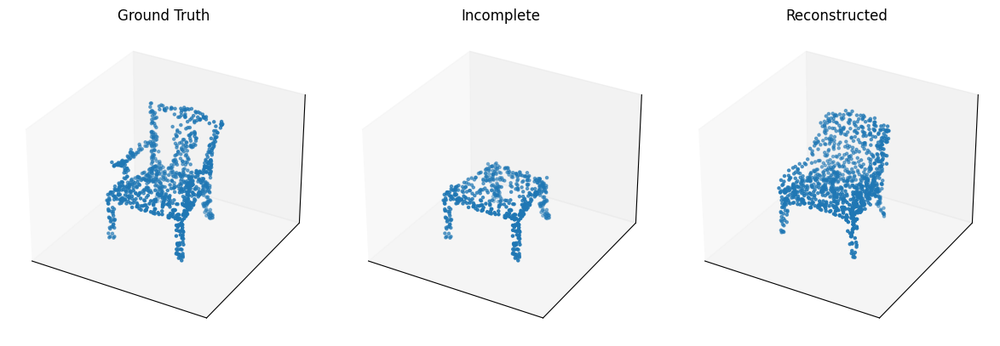

Epoch [22/100], Loss: 0.0924


Epoch [23/100]:   0%|          | 0/28 [00:00<?, ?it/s]

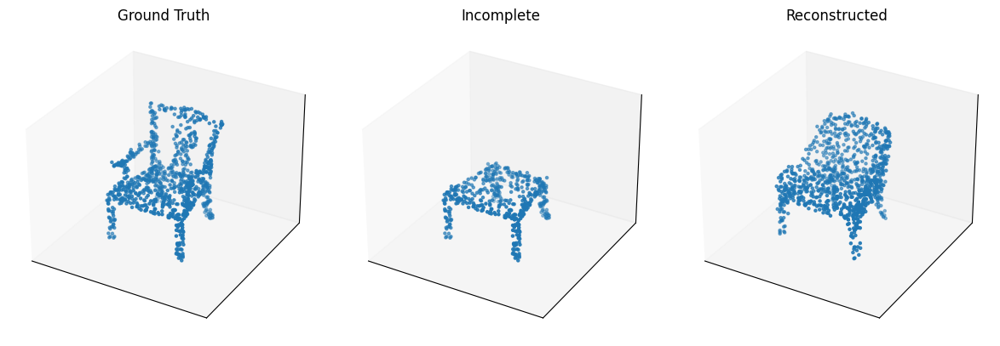

Epoch [23/100], Loss: 0.0922


Epoch [24/100]:   0%|          | 0/28 [00:00<?, ?it/s]

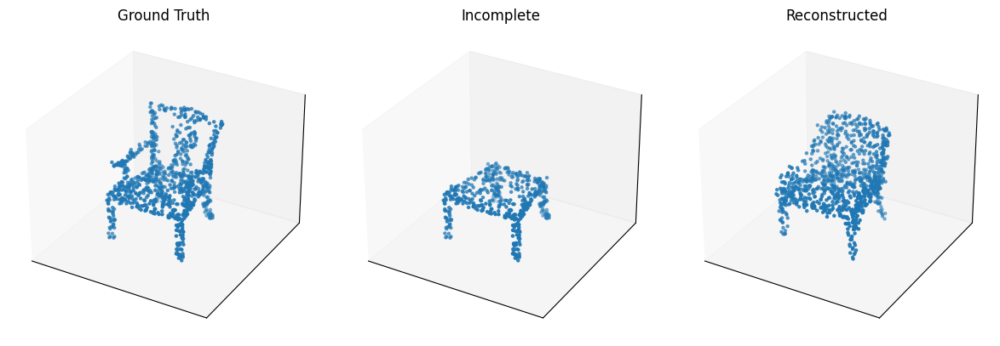

Epoch [24/100], Loss: 0.0923


Epoch [25/100]:   0%|          | 0/28 [00:00<?, ?it/s]

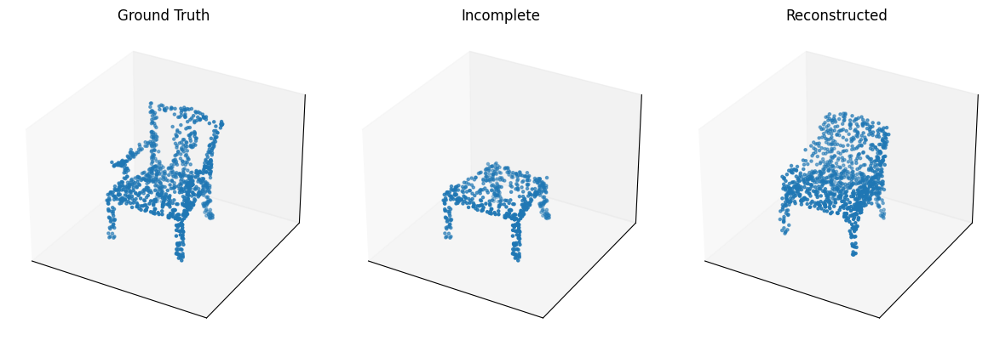

Epoch [25/100], Loss: 0.0917


Epoch [26/100]:   0%|          | 0/28 [00:00<?, ?it/s]

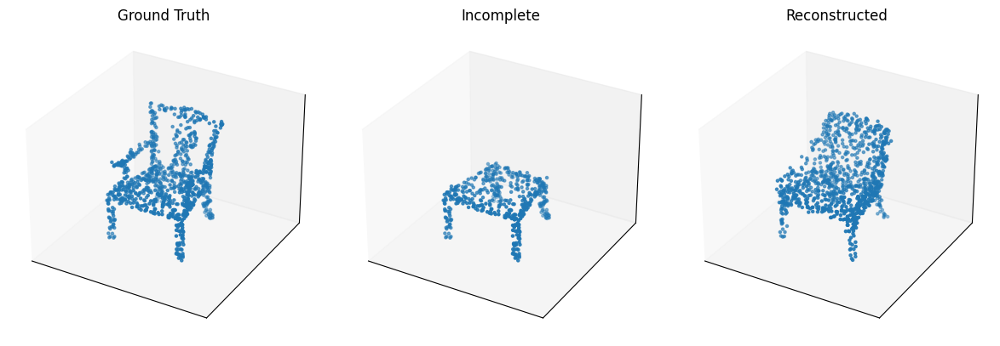

Epoch [26/100], Loss: 0.0904


Epoch [27/100]:   0%|          | 0/28 [00:00<?, ?it/s]

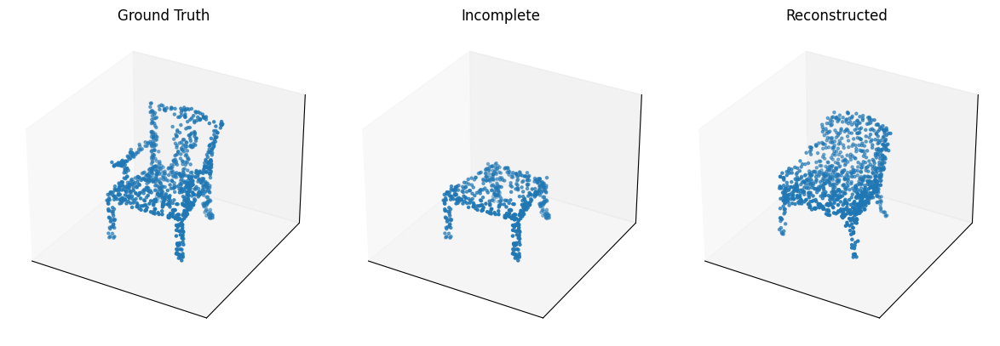

Epoch [27/100], Loss: 0.0898


Epoch [28/100]:   0%|          | 0/28 [00:00<?, ?it/s]

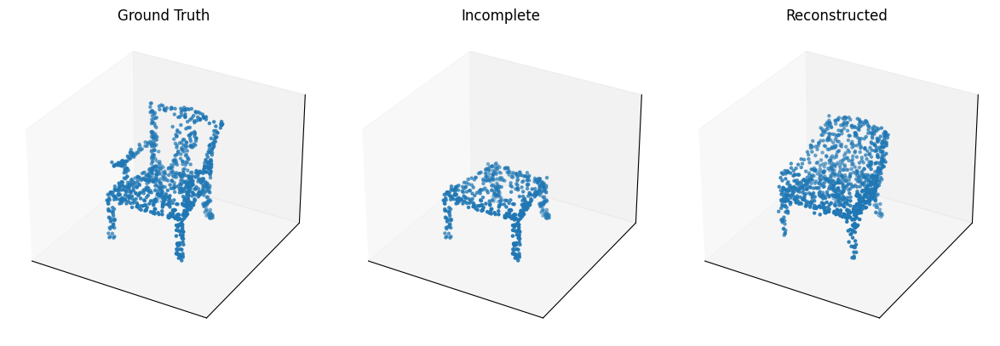

Epoch [28/100], Loss: 0.0901


Epoch [29/100]:   0%|          | 0/28 [00:00<?, ?it/s]

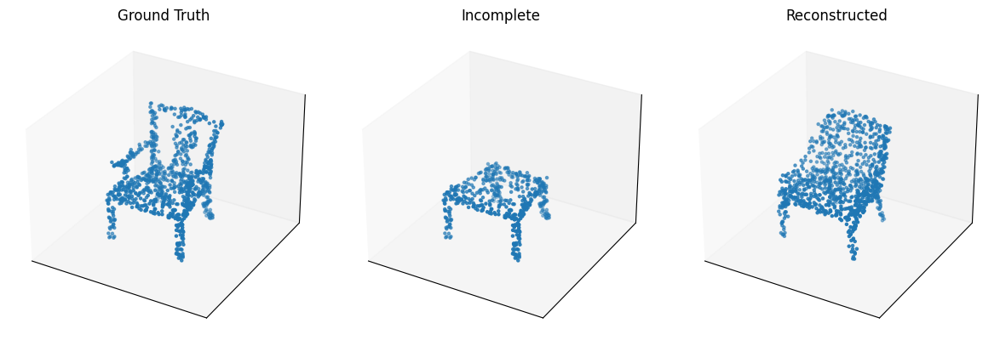

Epoch [29/100], Loss: 0.0890


Epoch [30/100]:   0%|          | 0/28 [00:00<?, ?it/s]

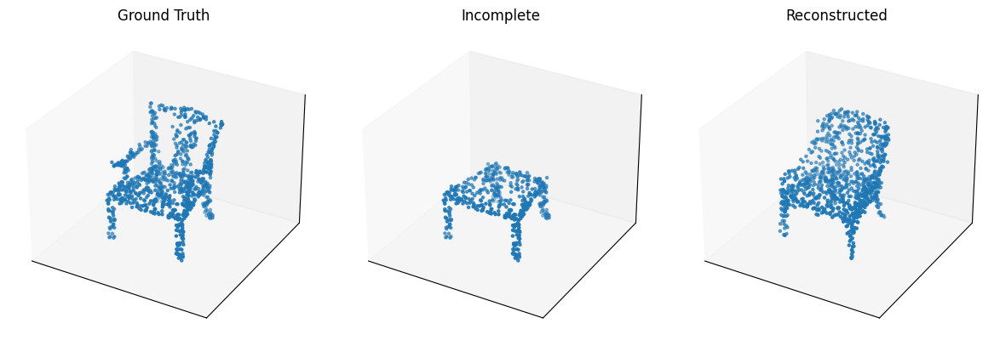

Epoch [30/100], Loss: 0.0884


Epoch [31/100]:   0%|          | 0/28 [00:00<?, ?it/s]

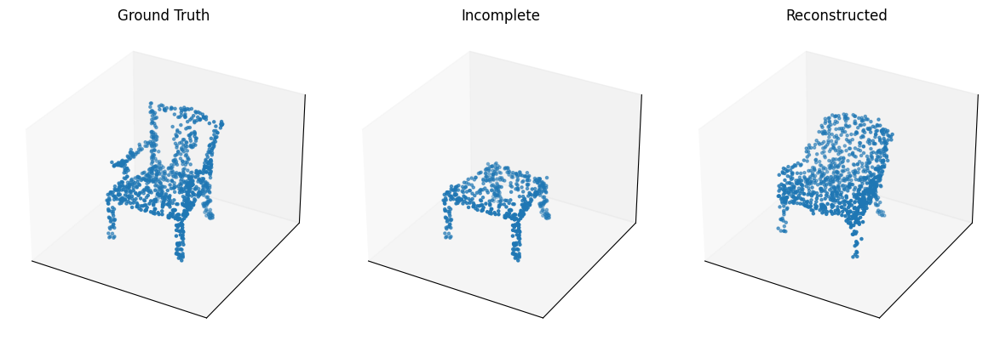

Epoch [31/100], Loss: 0.0903


Epoch [32/100]:   0%|          | 0/28 [00:00<?, ?it/s]

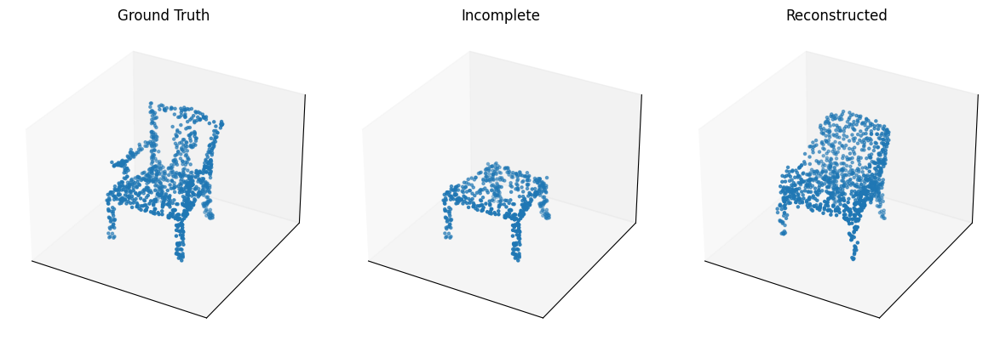

Epoch [32/100], Loss: 0.0893


Epoch [33/100]:   0%|          | 0/28 [00:00<?, ?it/s]

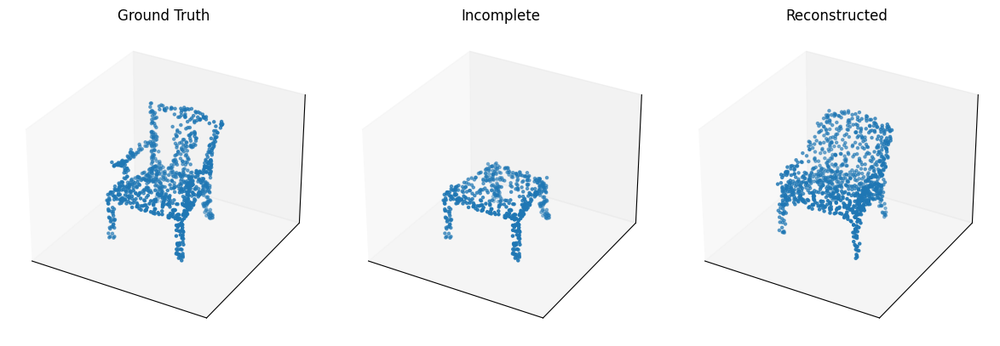

Epoch [33/100], Loss: 0.0874


Epoch [34/100]:   0%|          | 0/28 [00:00<?, ?it/s]

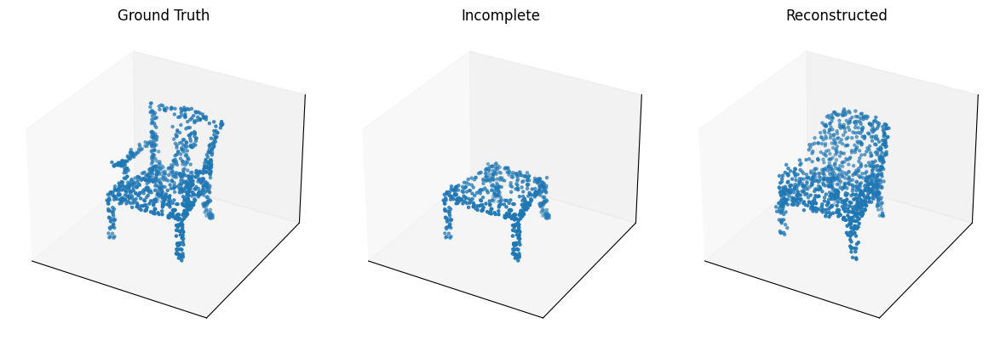

Epoch [34/100], Loss: 0.0876


Epoch [35/100]:   0%|          | 0/28 [00:00<?, ?it/s]

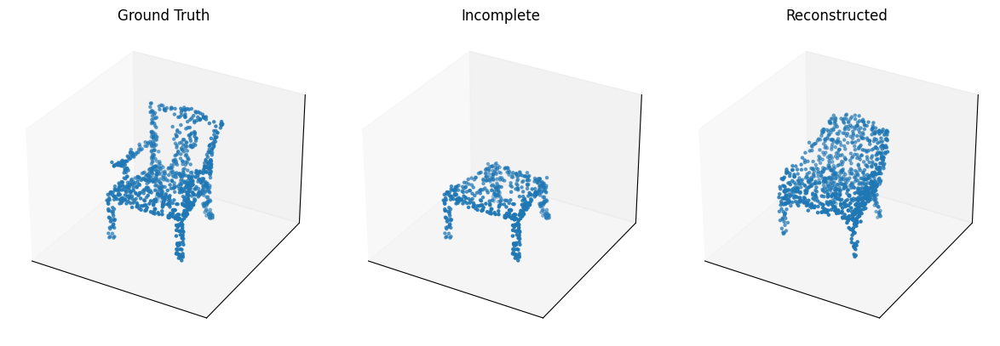

Epoch [35/100], Loss: 0.0867


Epoch [36/100]:   0%|          | 0/28 [00:00<?, ?it/s]

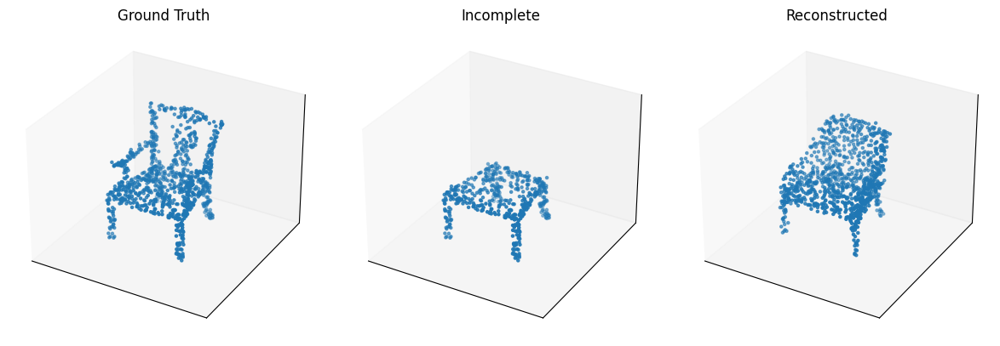

Epoch [36/100], Loss: 0.0863


Epoch [37/100]:   0%|          | 0/28 [00:00<?, ?it/s]

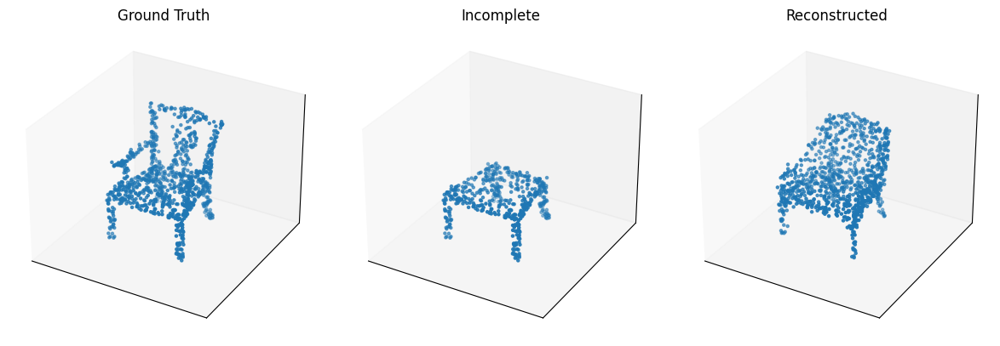

Epoch [37/100], Loss: 0.0867


Epoch [38/100]:   0%|          | 0/28 [00:00<?, ?it/s]

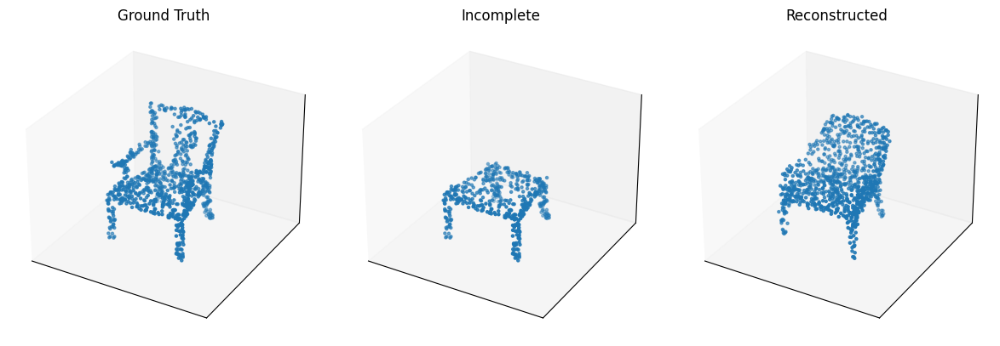

Epoch [38/100], Loss: 0.0860


Epoch [39/100]:   0%|          | 0/28 [00:00<?, ?it/s]

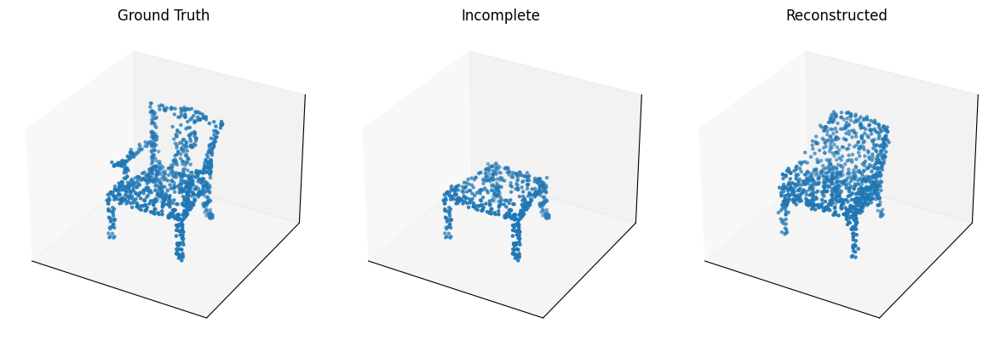

Epoch [39/100], Loss: 0.0849


Epoch [40/100]:   0%|          | 0/28 [00:00<?, ?it/s]

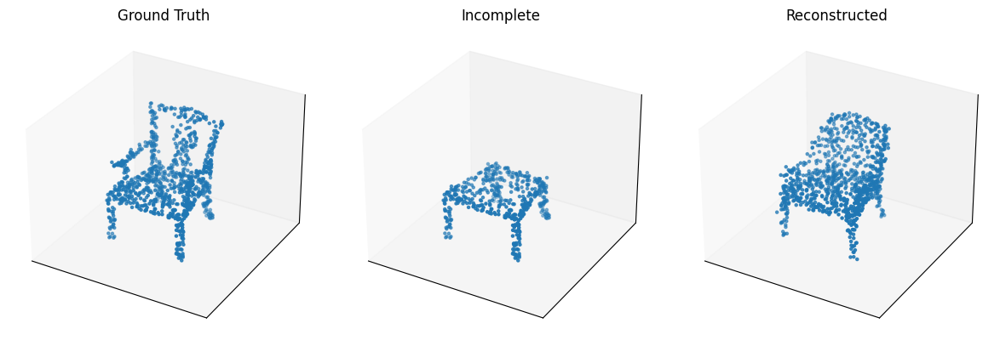

Epoch [40/100], Loss: 0.0851


Epoch [41/100]:   0%|          | 0/28 [00:00<?, ?it/s]

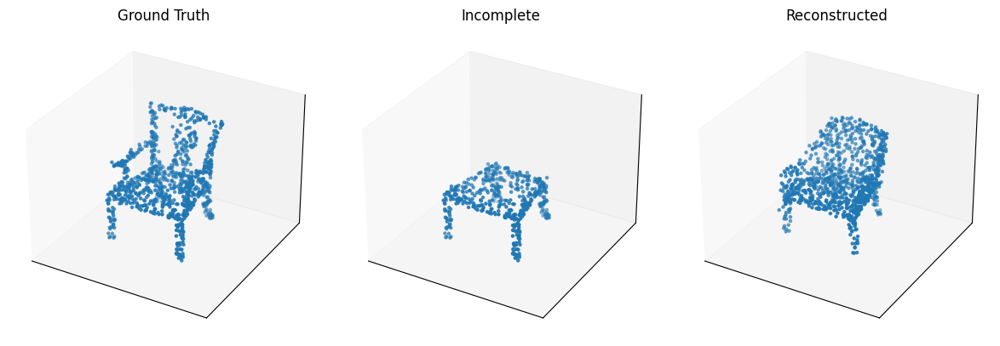

Epoch [41/100], Loss: 0.0844


Epoch [42/100]:   0%|          | 0/28 [00:00<?, ?it/s]

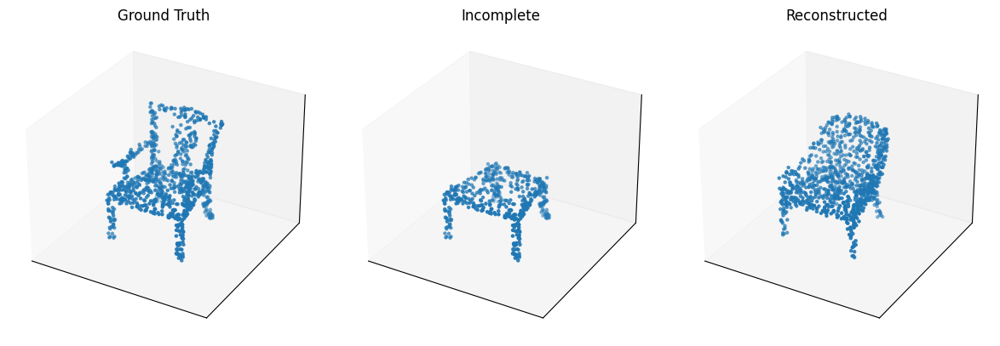

Epoch [42/100], Loss: 0.0850


Epoch [43/100]:   0%|          | 0/28 [00:00<?, ?it/s]

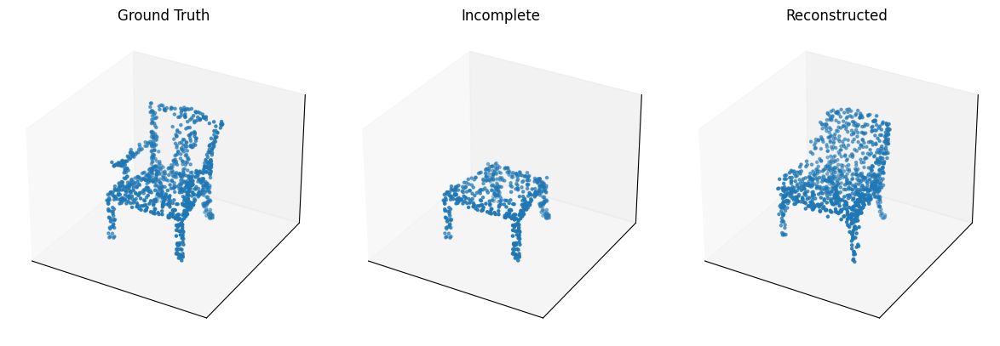

Epoch [43/100], Loss: 0.0852


Epoch [44/100]:   0%|          | 0/28 [00:00<?, ?it/s]

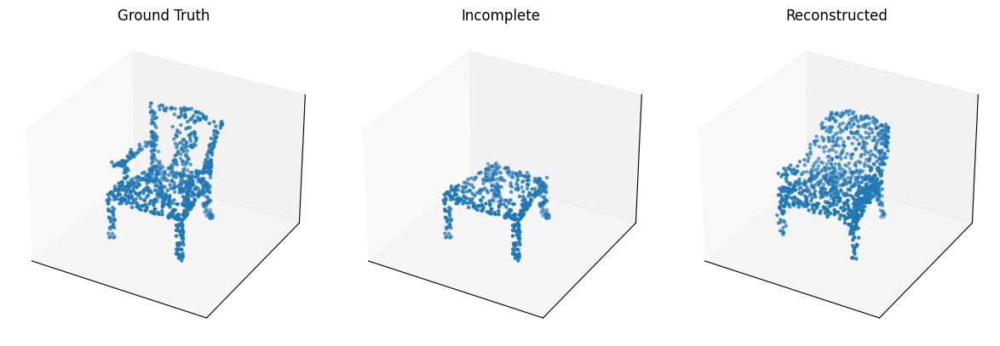

Epoch [44/100], Loss: 0.0843


Epoch [45/100]:   0%|          | 0/28 [00:00<?, ?it/s]

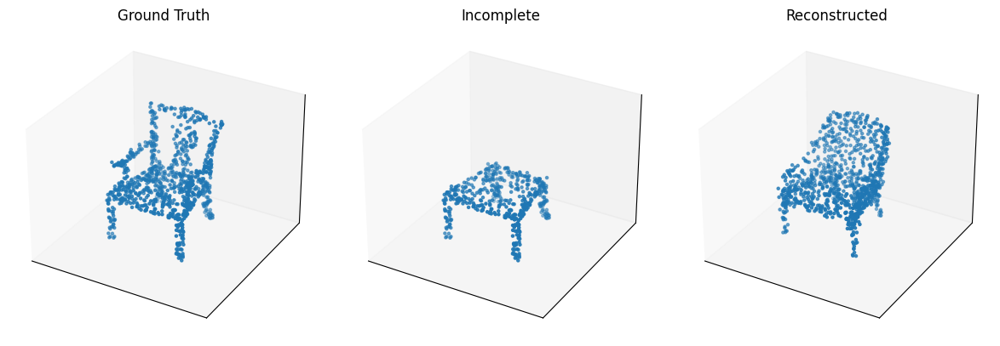

Epoch [45/100], Loss: 0.0838


Epoch [46/100]:   0%|          | 0/28 [00:00<?, ?it/s]

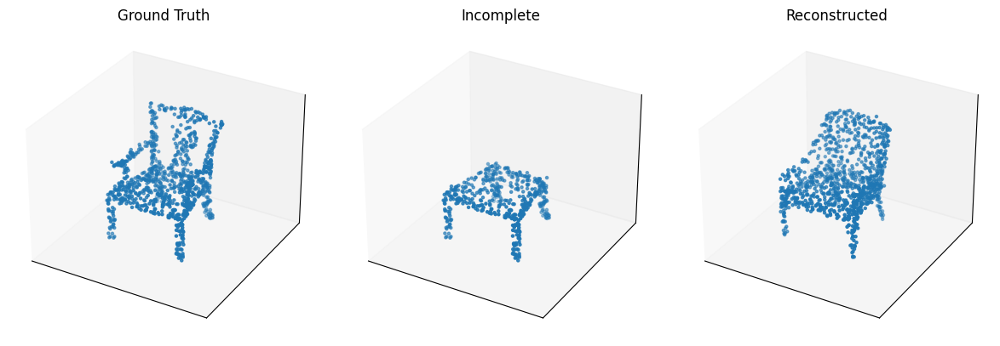

Epoch [46/100], Loss: 0.0829


Epoch [47/100]:   0%|          | 0/28 [00:00<?, ?it/s]

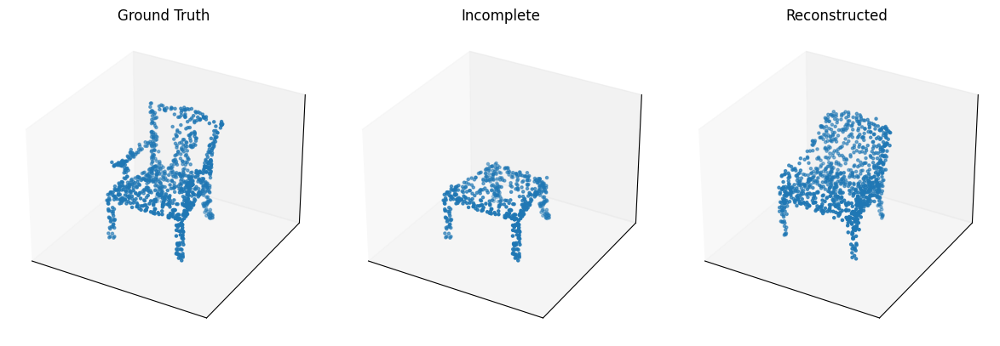

Epoch [47/100], Loss: 0.0830


Epoch [48/100]:   0%|          | 0/28 [00:00<?, ?it/s]

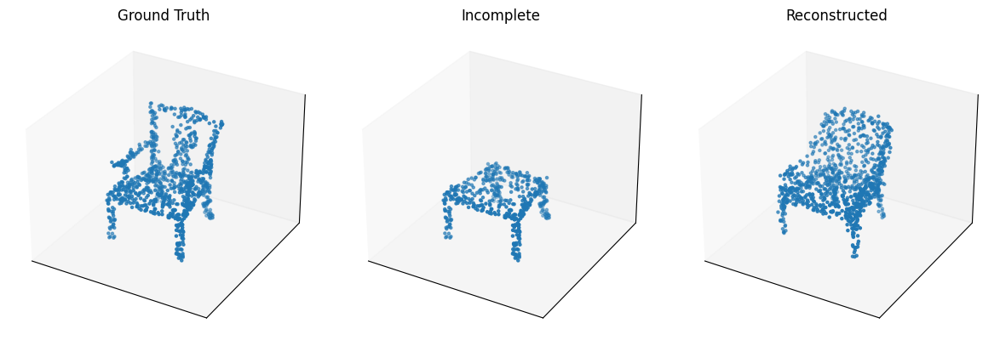

Epoch [48/100], Loss: 0.0831


Epoch [49/100]:   0%|          | 0/28 [00:00<?, ?it/s]

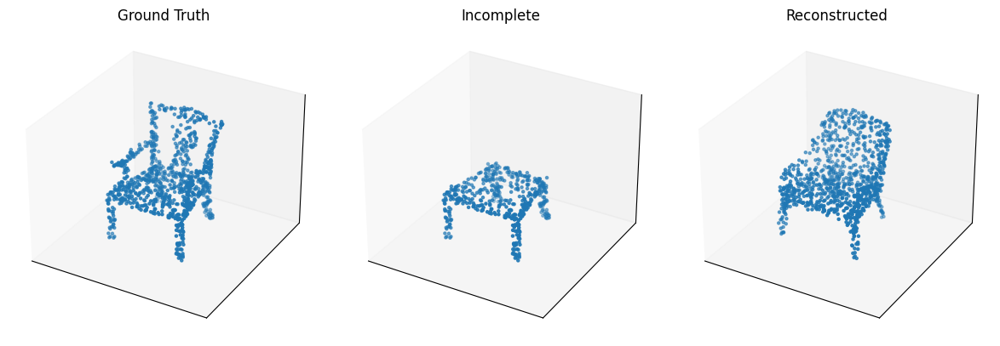

Epoch [49/100], Loss: 0.0830


Epoch [50/100]:   0%|          | 0/28 [00:00<?, ?it/s]

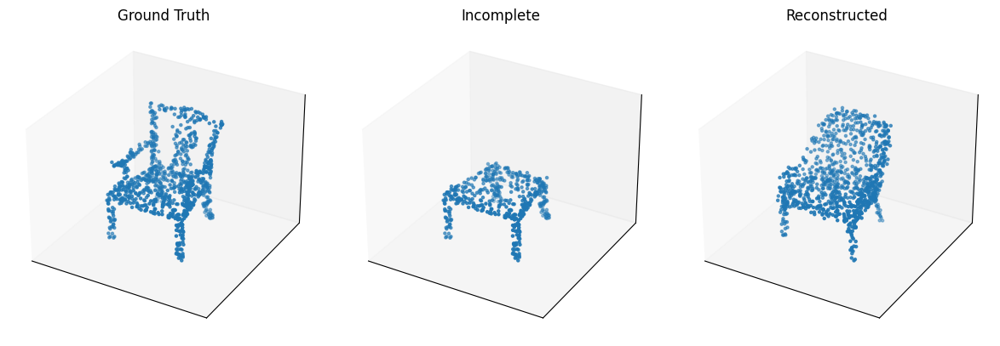

Epoch [50/100], Loss: 0.0827


Epoch [51/100]:   0%|          | 0/28 [00:00<?, ?it/s]

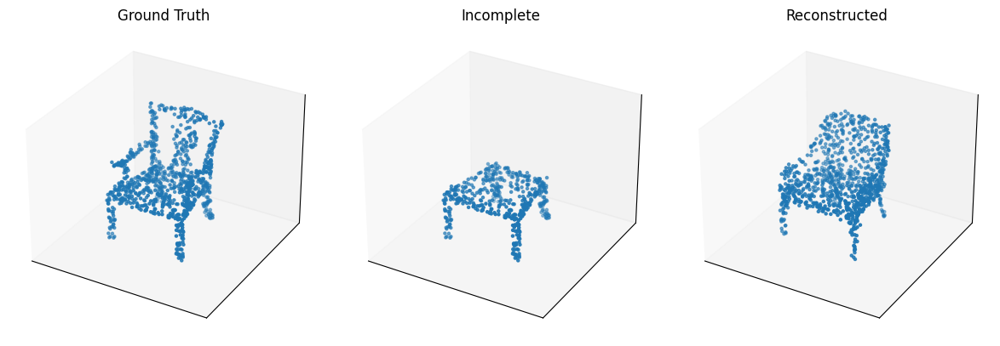

Epoch [51/100], Loss: 0.0825


Epoch [52/100]:   0%|          | 0/28 [00:00<?, ?it/s]

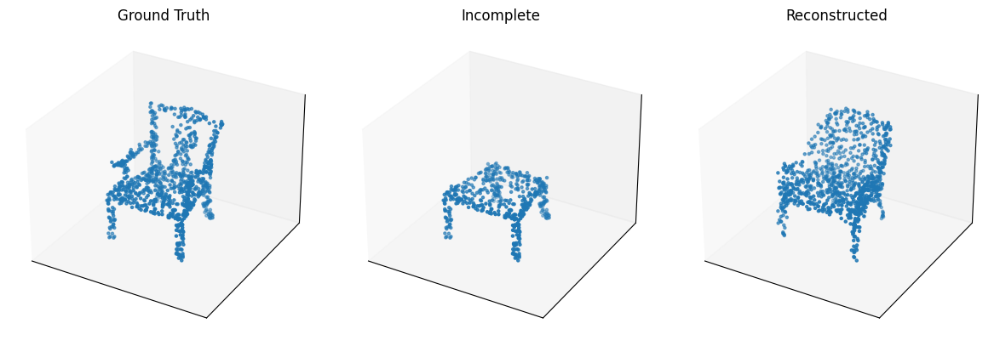

Epoch [52/100], Loss: 0.0818


Epoch [53/100]:   0%|          | 0/28 [00:00<?, ?it/s]

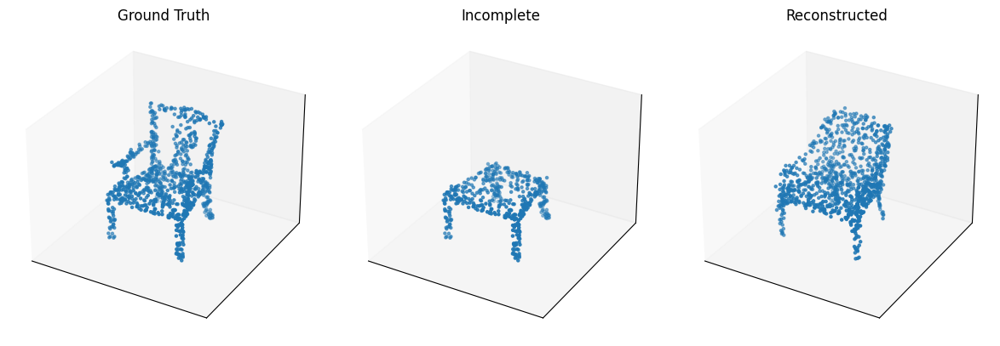

Epoch [53/100], Loss: 0.0813


Epoch [54/100]:   0%|          | 0/28 [00:00<?, ?it/s]

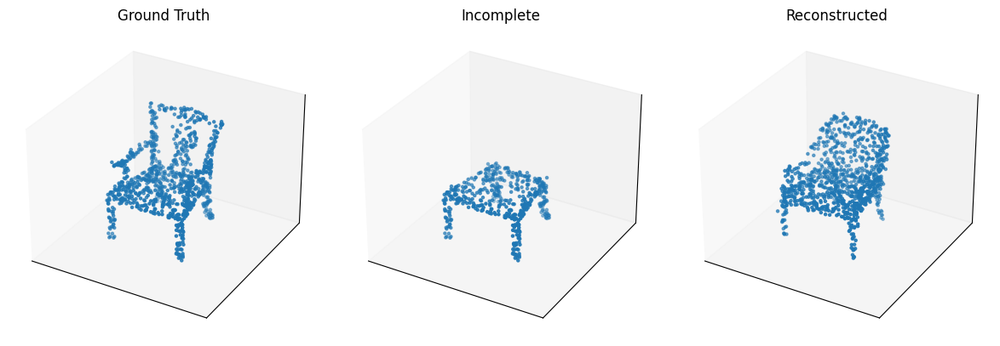

Epoch [54/100], Loss: 0.0817


Epoch [55/100]:   0%|          | 0/28 [00:00<?, ?it/s]

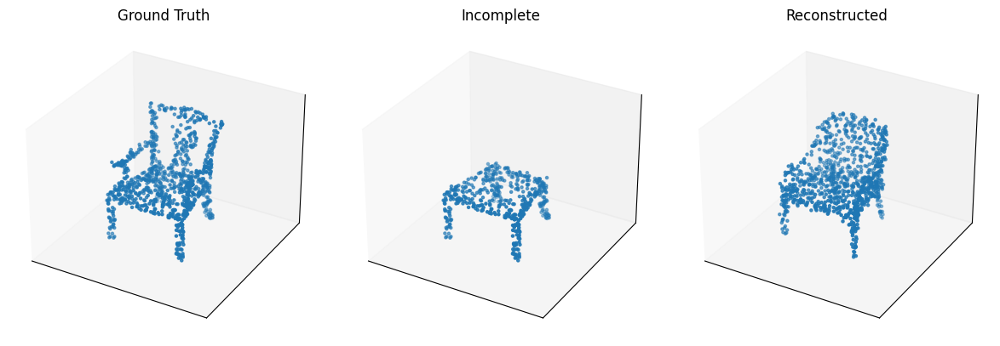

Epoch [55/100], Loss: 0.0817


Epoch [56/100]:   0%|          | 0/28 [00:00<?, ?it/s]

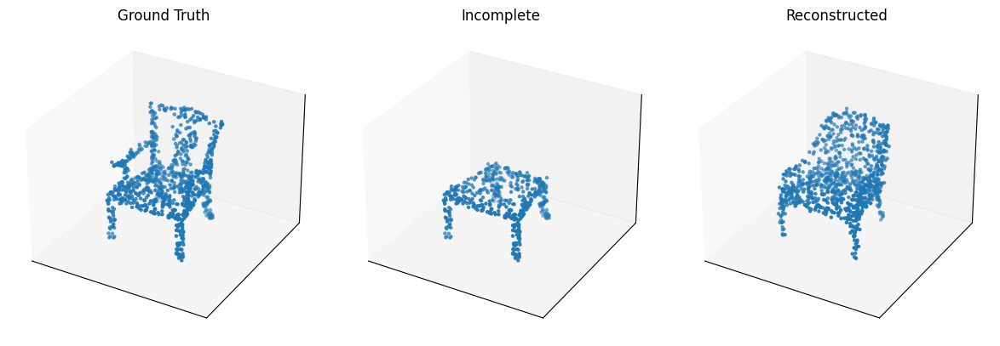

Epoch [56/100], Loss: 0.0800


Epoch [57/100]:   0%|          | 0/28 [00:00<?, ?it/s]

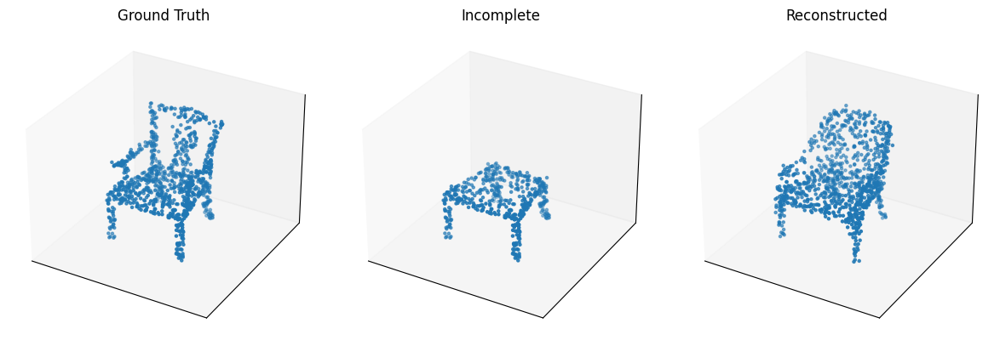

Epoch [57/100], Loss: 0.0796


Epoch [58/100]:   0%|          | 0/28 [00:00<?, ?it/s]

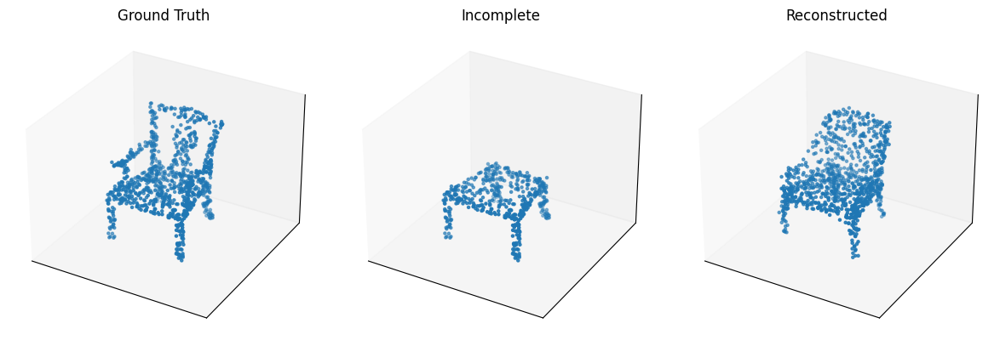

Epoch [58/100], Loss: 0.0806


Epoch [59/100]:   0%|          | 0/28 [00:00<?, ?it/s]

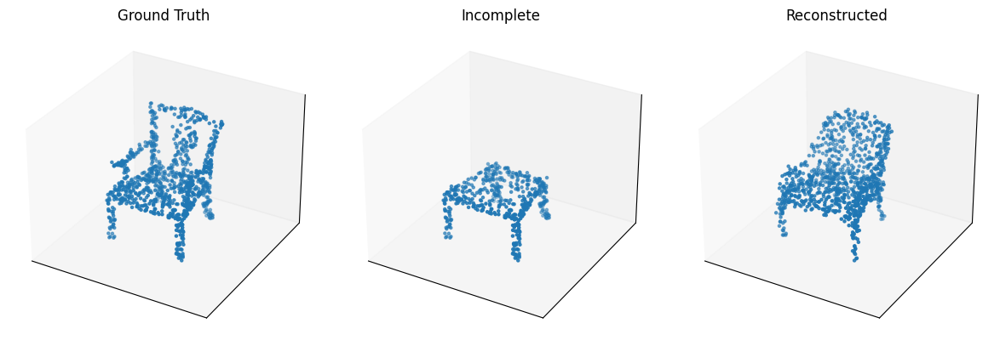

Epoch [59/100], Loss: 0.0791


Epoch [60/100]:   0%|          | 0/28 [00:00<?, ?it/s]

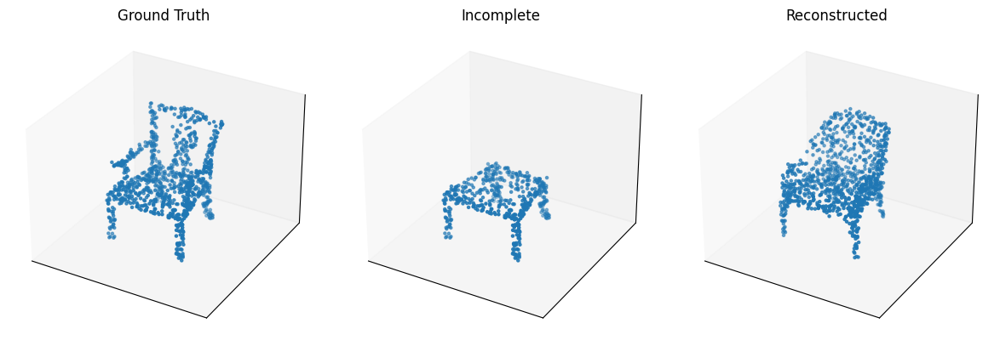

Epoch [60/100], Loss: 0.0795


Epoch [61/100]:   0%|          | 0/28 [00:00<?, ?it/s]

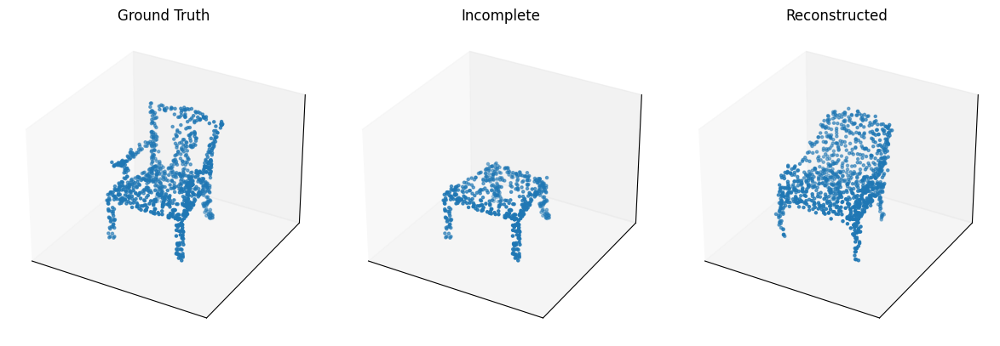

Epoch [61/100], Loss: 0.0807


Epoch [62/100]:   0%|          | 0/28 [00:00<?, ?it/s]

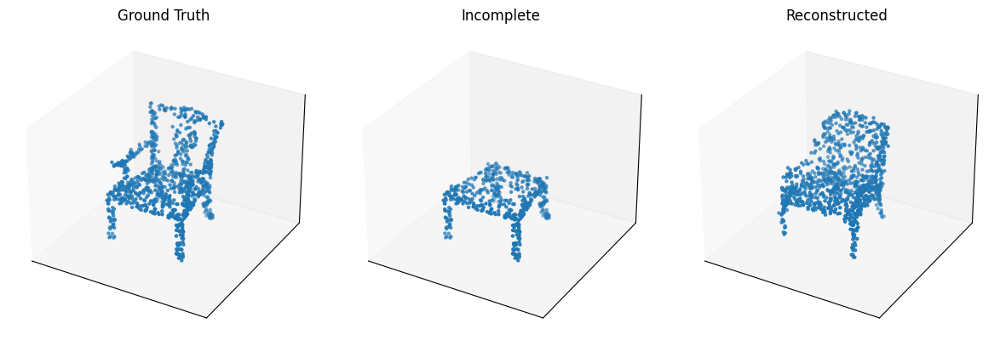

Epoch [62/100], Loss: 0.0805


Epoch [63/100]:   0%|          | 0/28 [00:00<?, ?it/s]

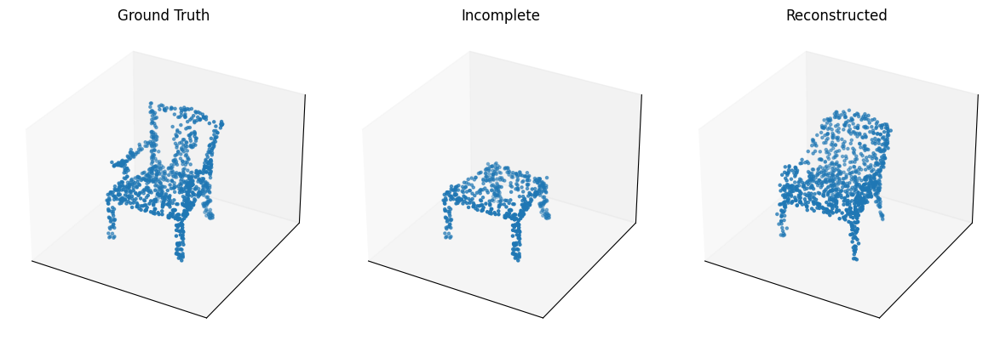

Epoch [63/100], Loss: 0.0782


Epoch [64/100]:   0%|          | 0/28 [00:00<?, ?it/s]

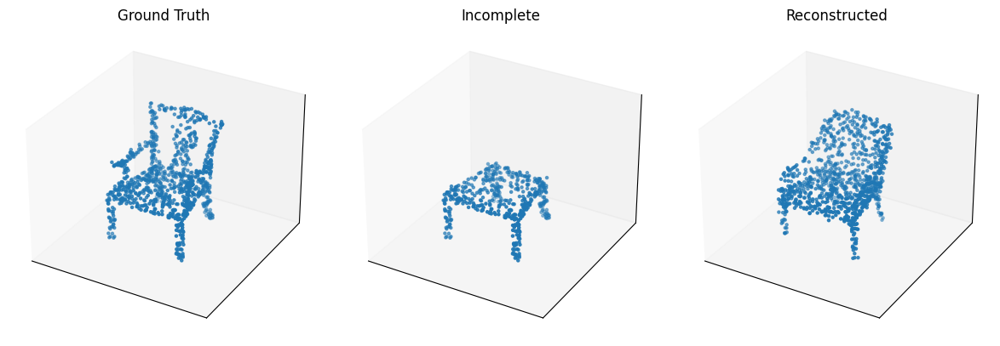

Epoch [64/100], Loss: 0.0778


Epoch [65/100]:   0%|          | 0/28 [00:00<?, ?it/s]

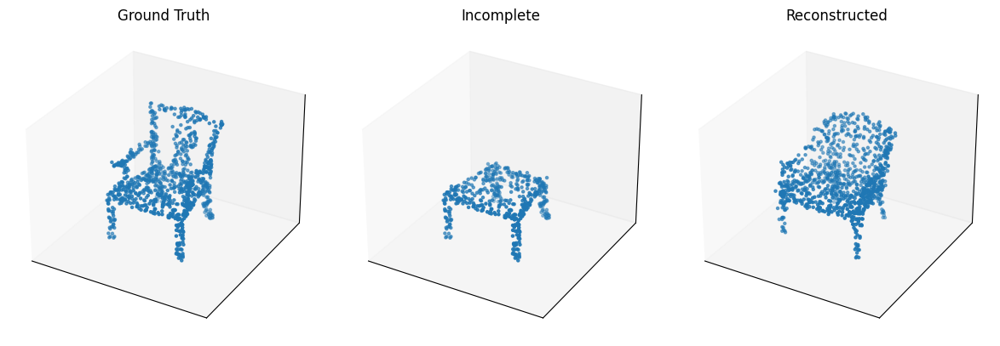

Epoch [65/100], Loss: 0.0786


Epoch [66/100]:   0%|          | 0/28 [00:00<?, ?it/s]

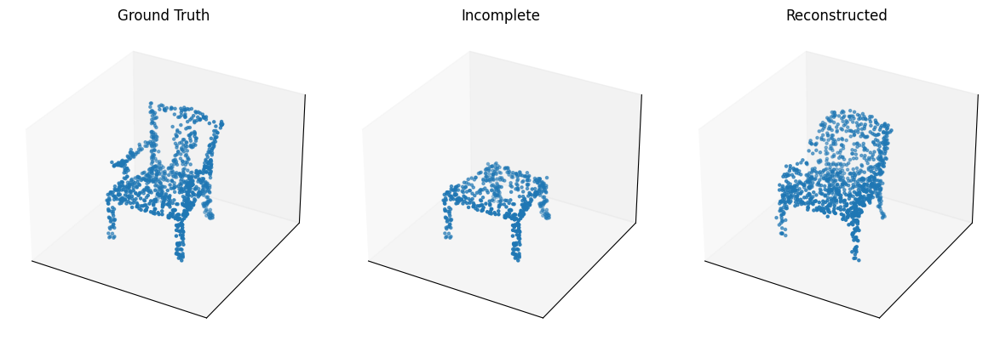

Epoch [66/100], Loss: 0.0793


Epoch [67/100]:   0%|          | 0/28 [00:00<?, ?it/s]

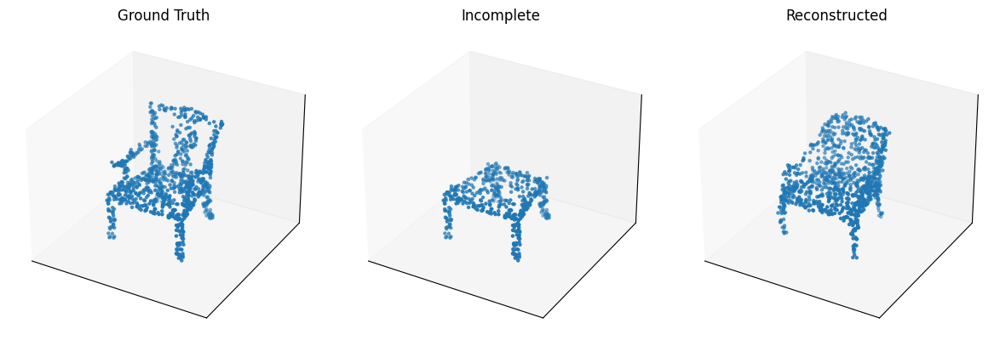

Epoch [67/100], Loss: 0.0777


Epoch [68/100]:   0%|          | 0/28 [00:00<?, ?it/s]

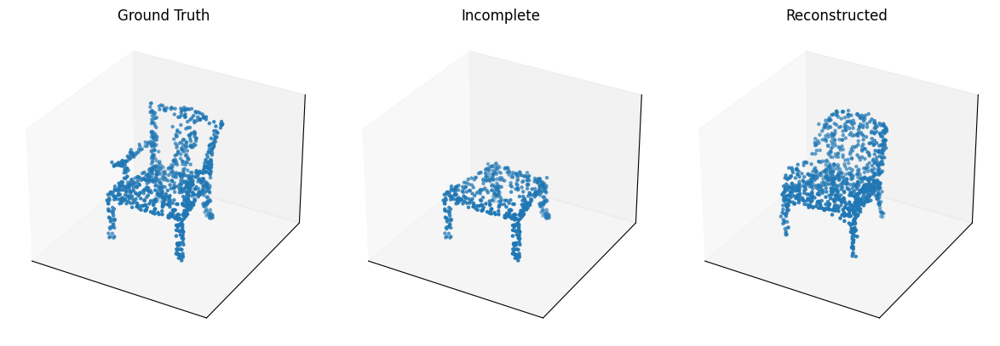

Epoch [68/100], Loss: 0.0792


Epoch [69/100]:   0%|          | 0/28 [00:00<?, ?it/s]

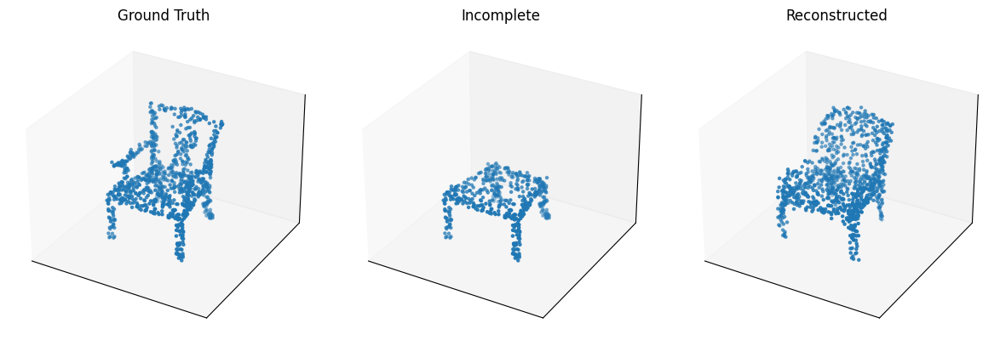

Epoch [69/100], Loss: 0.0792


Epoch [70/100]:   0%|          | 0/28 [00:00<?, ?it/s]

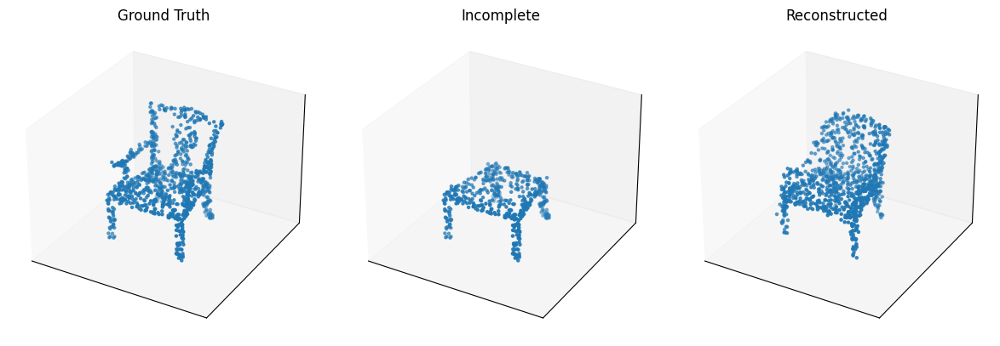

Epoch [70/100], Loss: 0.0785


Epoch [71/100]:   0%|          | 0/28 [00:00<?, ?it/s]

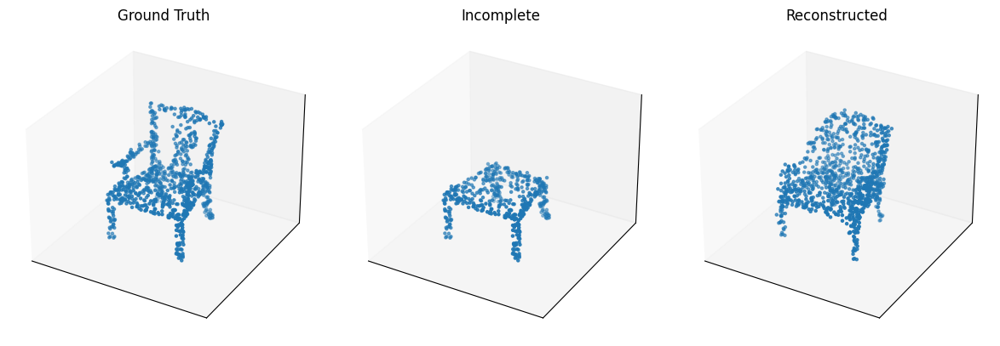

Epoch [71/100], Loss: 0.0765


Epoch [72/100]:   0%|          | 0/28 [00:00<?, ?it/s]

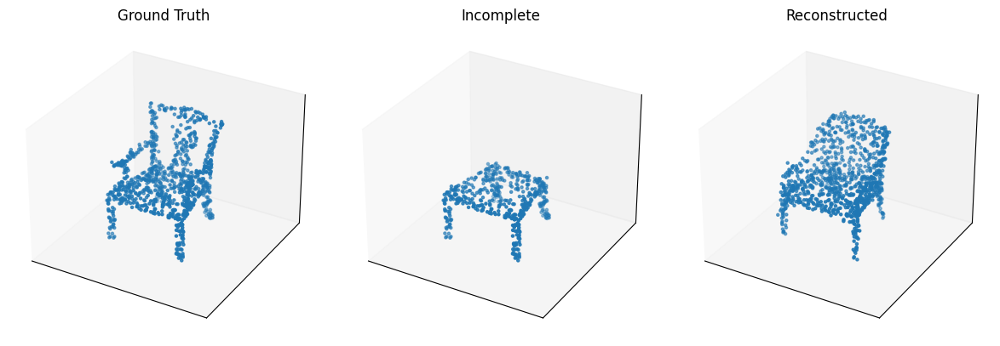

Epoch [72/100], Loss: 0.0770


Epoch [73/100]:   0%|          | 0/28 [00:00<?, ?it/s]

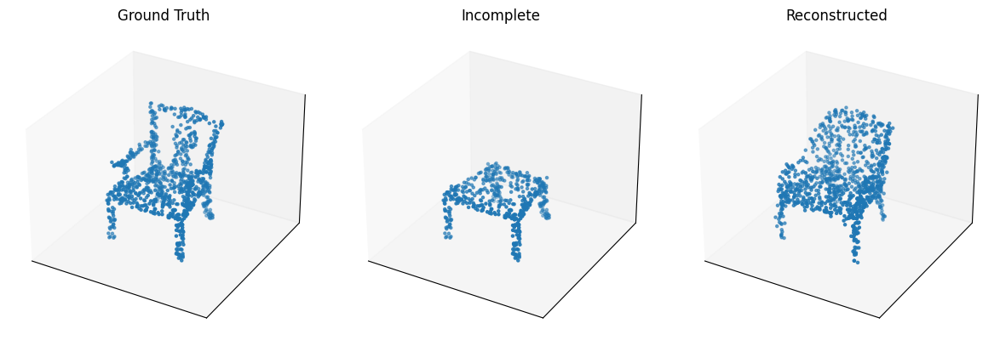

Epoch [73/100], Loss: 0.0782


Epoch [74/100]:   0%|          | 0/28 [00:00<?, ?it/s]

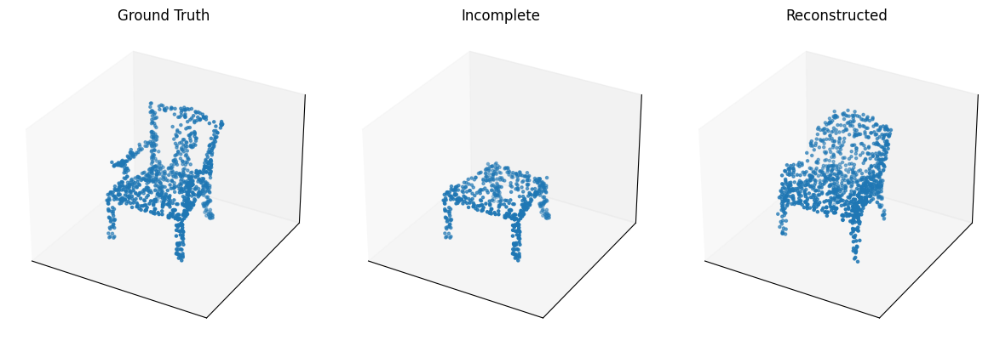

Epoch [74/100], Loss: 0.0763


Epoch [75/100]:   0%|          | 0/28 [00:00<?, ?it/s]

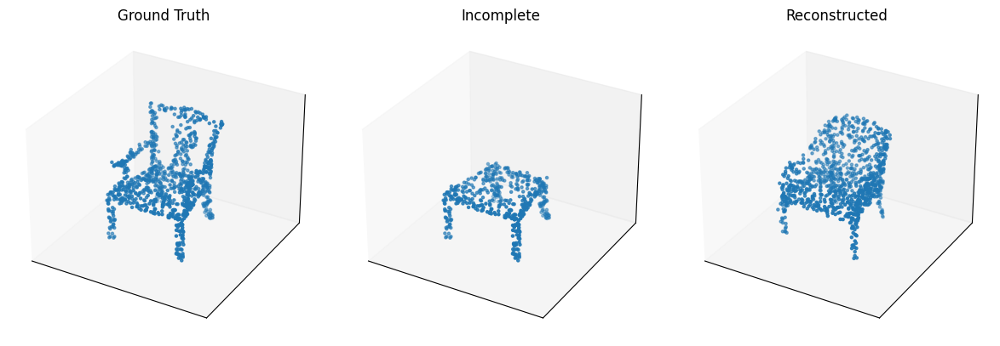

Epoch [75/100], Loss: 0.0765


Epoch [76/100]:   0%|          | 0/28 [00:00<?, ?it/s]

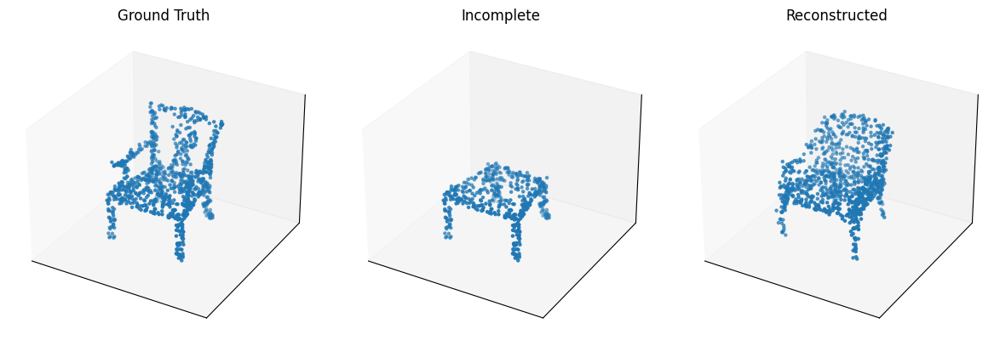

Epoch [76/100], Loss: 0.0755


Epoch [77/100]:   0%|          | 0/28 [00:00<?, ?it/s]

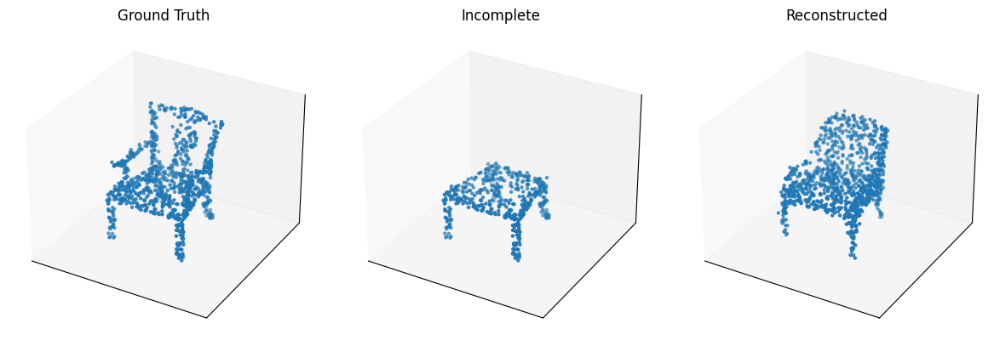

Epoch [77/100], Loss: 0.0748


Epoch [78/100]:   0%|          | 0/28 [00:00<?, ?it/s]

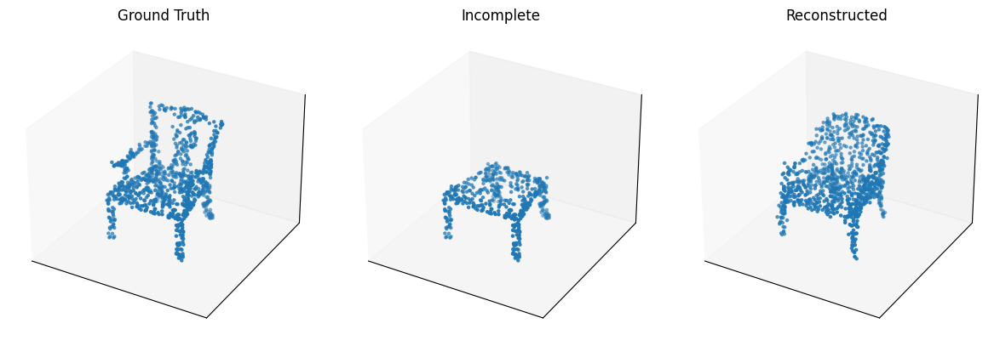

Epoch [78/100], Loss: 0.0753


Epoch [79/100]:   0%|          | 0/28 [00:00<?, ?it/s]

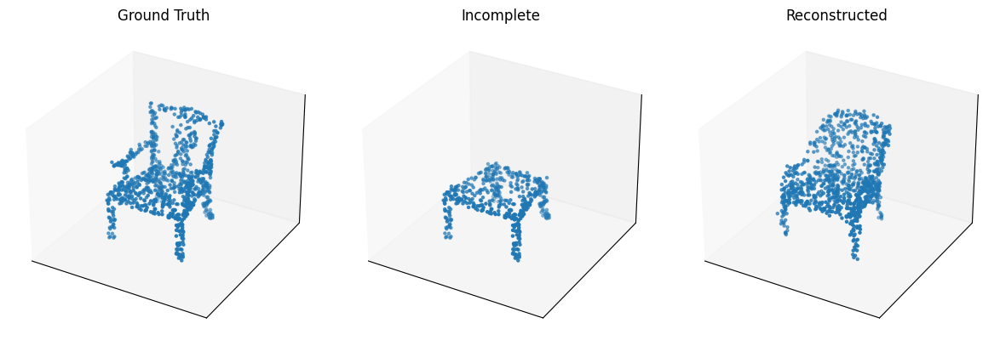

Epoch [79/100], Loss: 0.0750


Epoch [80/100]:   0%|          | 0/28 [00:00<?, ?it/s]

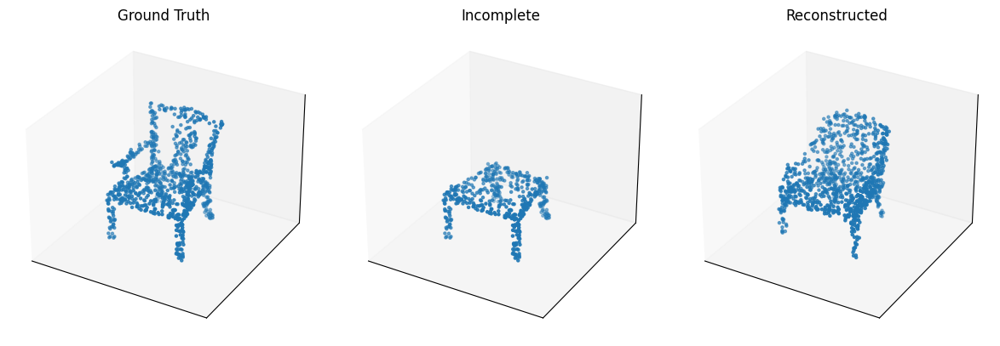

Epoch [80/100], Loss: 0.0762


Epoch [81/100]:   0%|          | 0/28 [00:00<?, ?it/s]

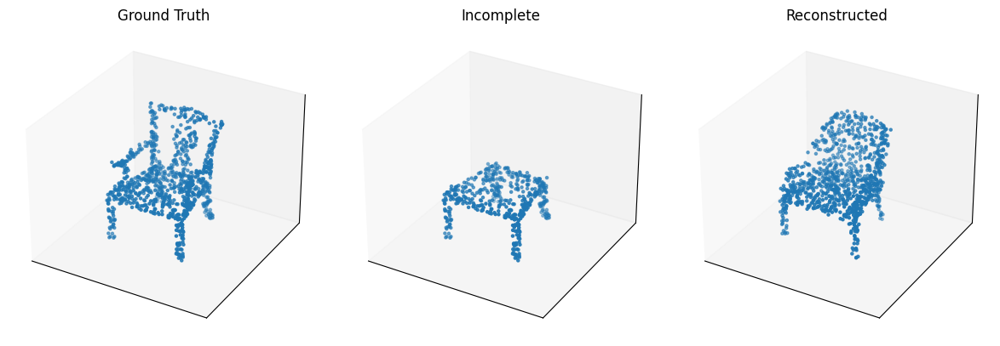

Epoch [81/100], Loss: 0.0750


Epoch [82/100]:   0%|          | 0/28 [00:00<?, ?it/s]

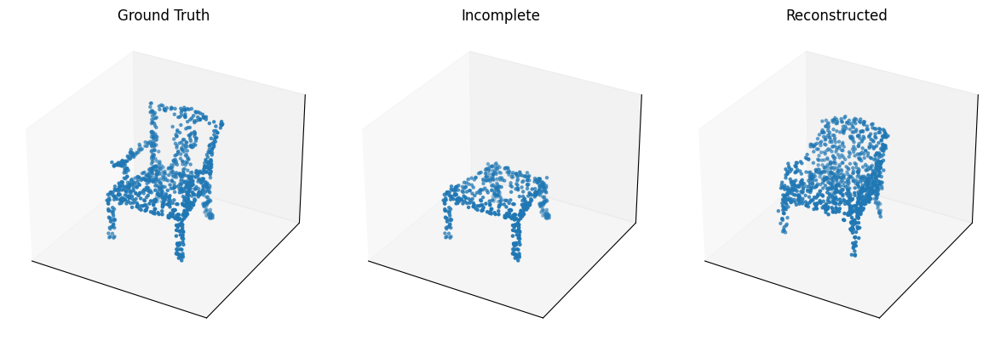

Epoch [82/100], Loss: 0.0758


Epoch [83/100]:   0%|          | 0/28 [00:00<?, ?it/s]

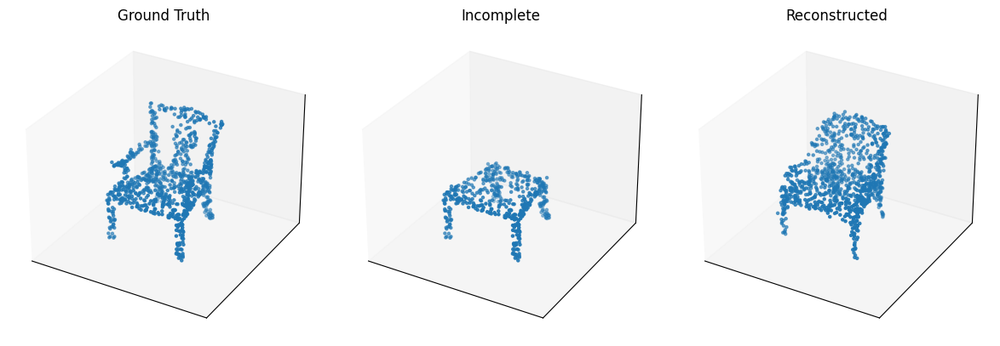

Epoch [83/100], Loss: 0.0744


Epoch [84/100]:   0%|          | 0/28 [00:00<?, ?it/s]

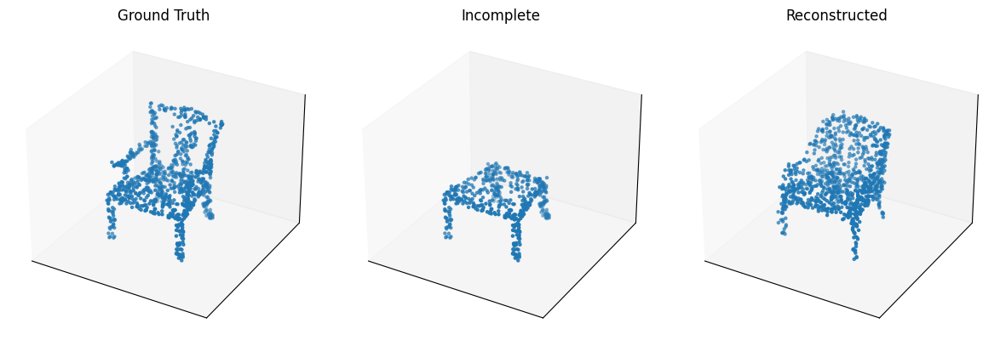

Epoch [84/100], Loss: 0.0737


Epoch [85/100]:   0%|          | 0/28 [00:00<?, ?it/s]

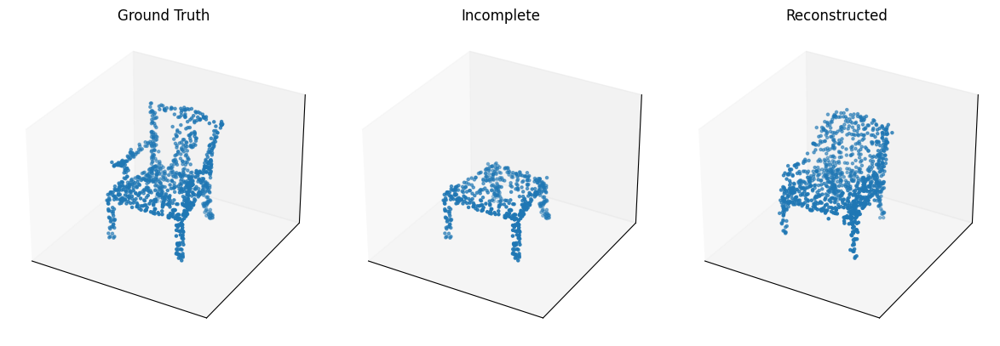

Epoch [85/100], Loss: 0.0745


Epoch [86/100]:   0%|          | 0/28 [00:00<?, ?it/s]

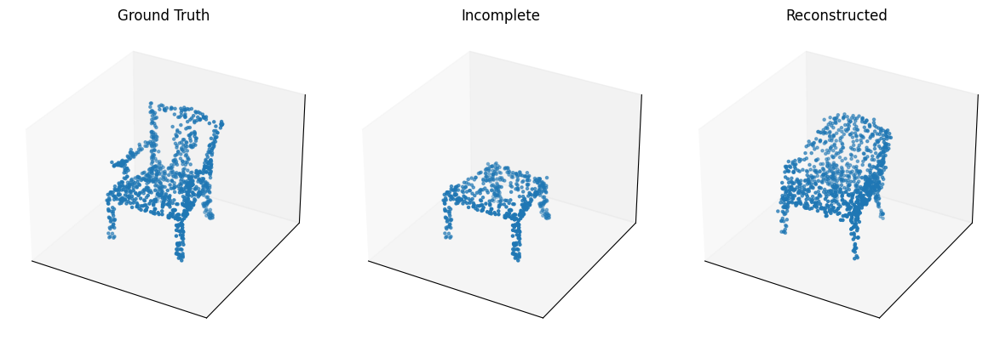

Epoch [86/100], Loss: 0.0743


Epoch [87/100]:   0%|          | 0/28 [00:00<?, ?it/s]

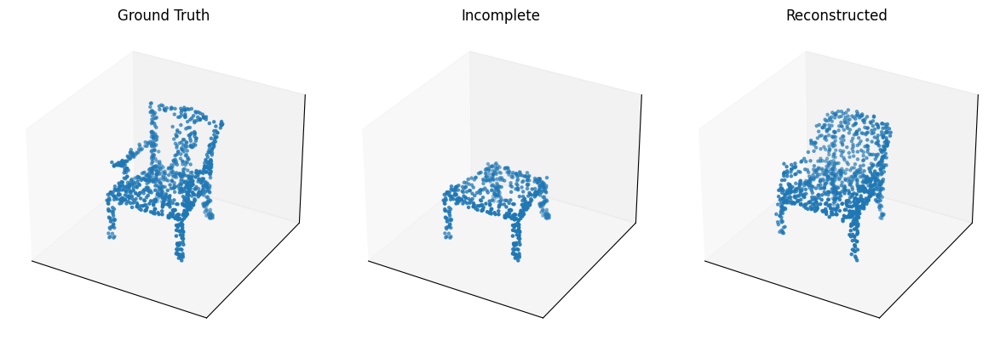

Epoch [87/100], Loss: 0.0733


Epoch [88/100]:   0%|          | 0/28 [00:00<?, ?it/s]

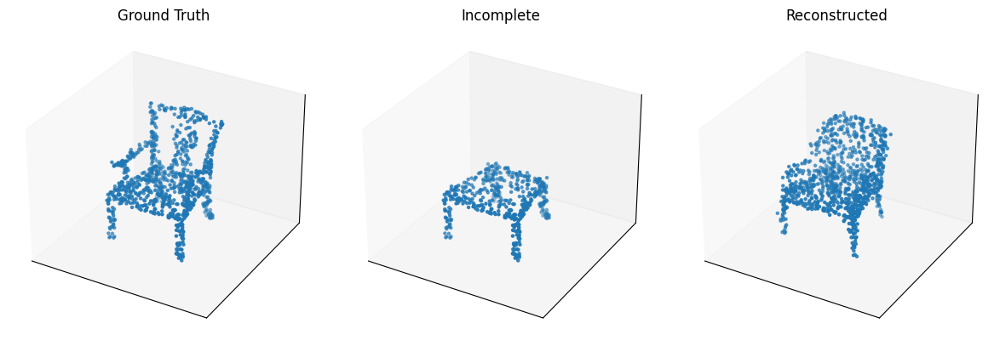

Epoch [88/100], Loss: 0.0730


Epoch [89/100]:   0%|          | 0/28 [00:00<?, ?it/s]

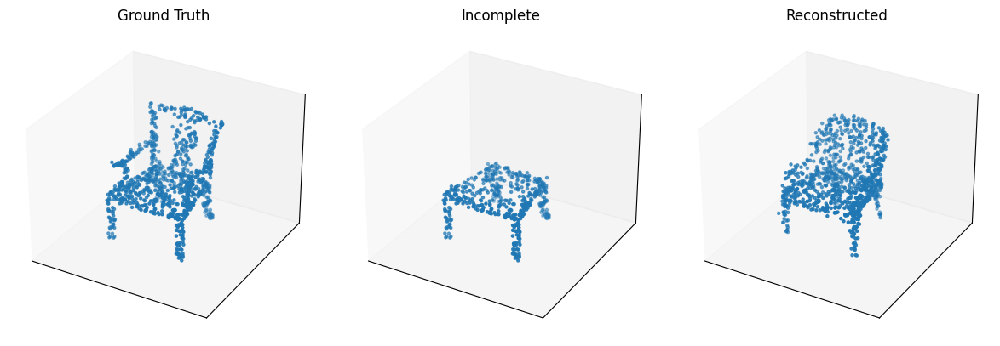

Epoch [89/100], Loss: 0.0748


Epoch [90/100]:   0%|          | 0/28 [00:00<?, ?it/s]

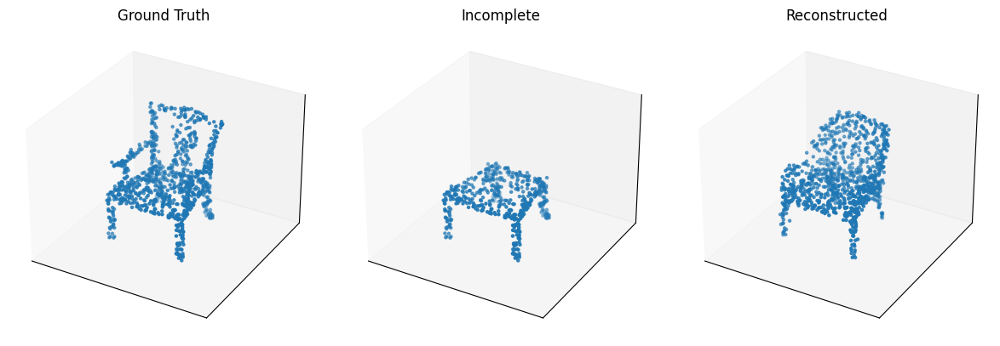

Epoch [90/100], Loss: 0.0738


Epoch [91/100]:   0%|          | 0/28 [00:00<?, ?it/s]

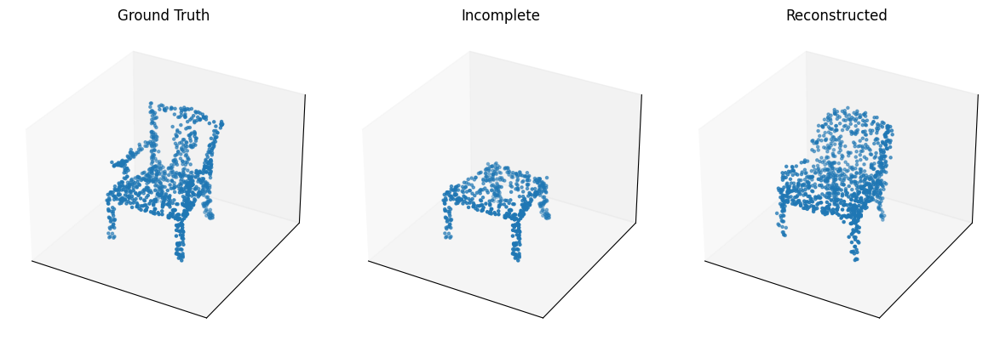

Epoch [91/100], Loss: 0.0740


Epoch [92/100]:   0%|          | 0/28 [00:00<?, ?it/s]

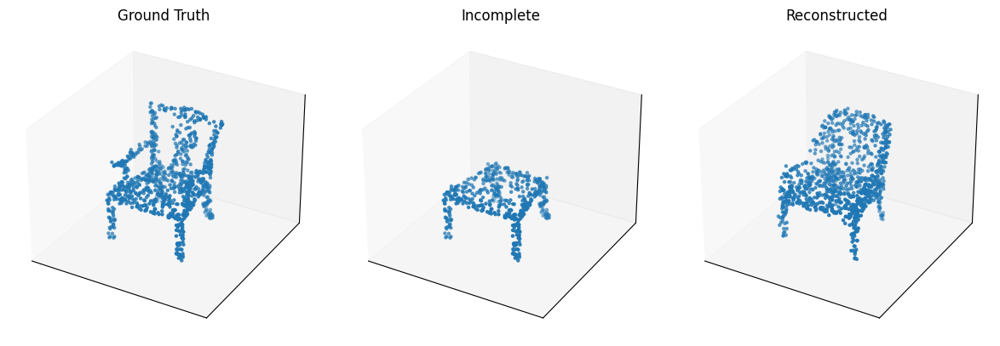

Epoch [92/100], Loss: 0.0728


Epoch [93/100]:   0%|          | 0/28 [00:00<?, ?it/s]

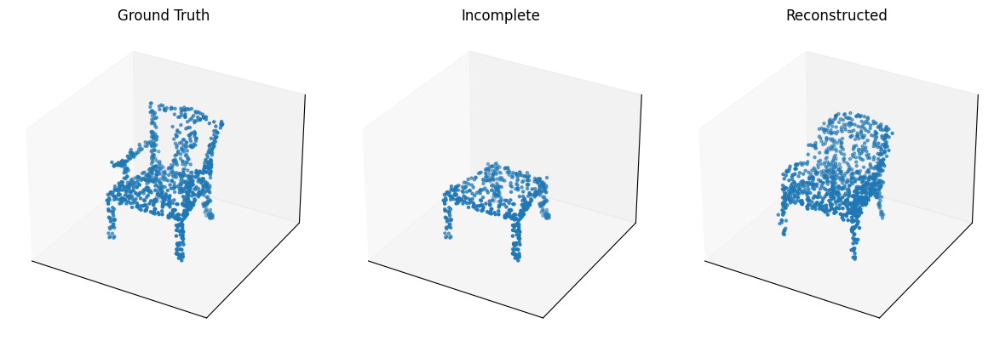

Epoch [93/100], Loss: 0.0727


Epoch [94/100]:   0%|          | 0/28 [00:00<?, ?it/s]

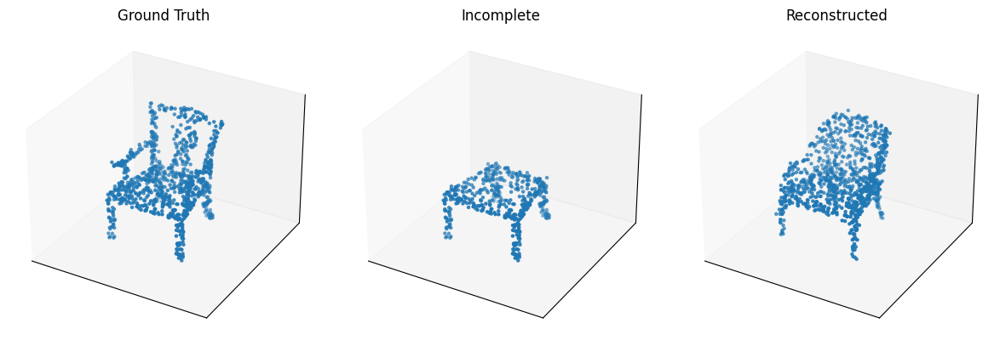

Epoch [94/100], Loss: 0.0726


Epoch [95/100]:   0%|          | 0/28 [00:00<?, ?it/s]

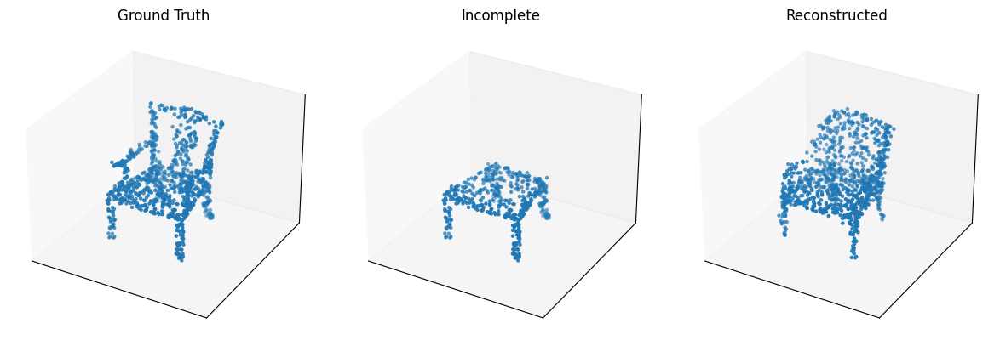

Epoch [95/100], Loss: 0.0730


Epoch [96/100]:   0%|          | 0/28 [00:00<?, ?it/s]

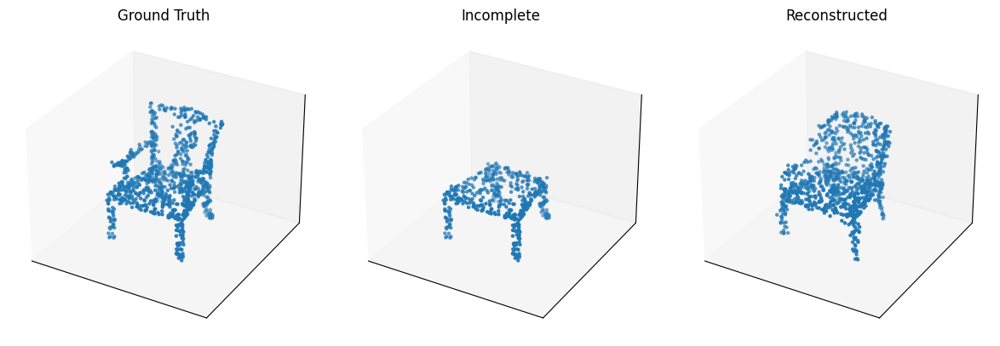

Epoch [96/100], Loss: 0.0728


Epoch [97/100]:   0%|          | 0/28 [00:00<?, ?it/s]

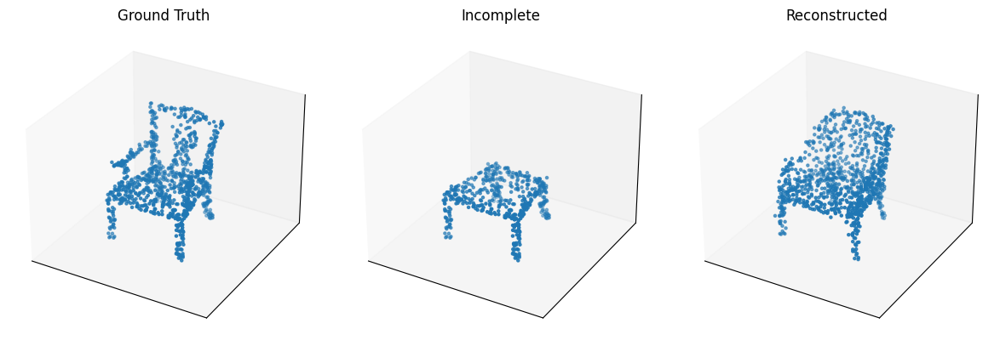

Epoch [97/100], Loss: 0.0733


Epoch [98/100]:   0%|          | 0/28 [00:00<?, ?it/s]

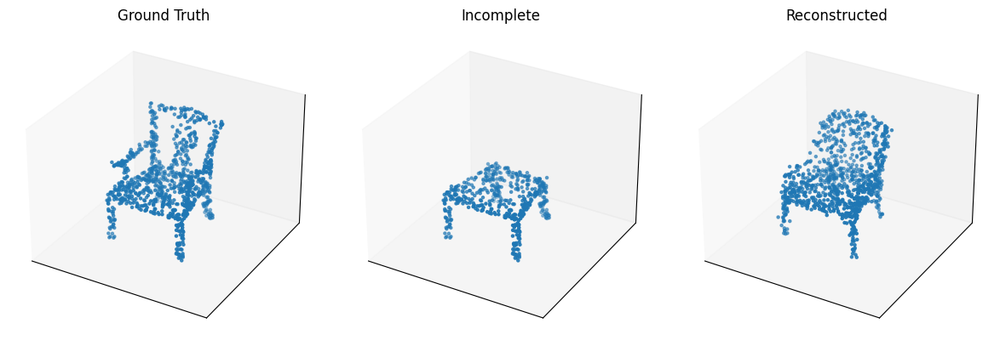

Epoch [98/100], Loss: 0.0719


Epoch [99/100]:   0%|          | 0/28 [00:00<?, ?it/s]

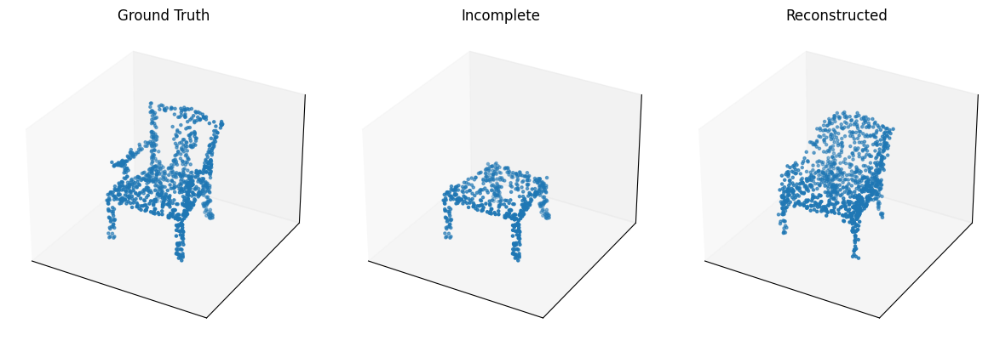

Epoch [99/100], Loss: 0.0719


Epoch [100/100]:   0%|          | 0/28 [00:00<?, ?it/s]

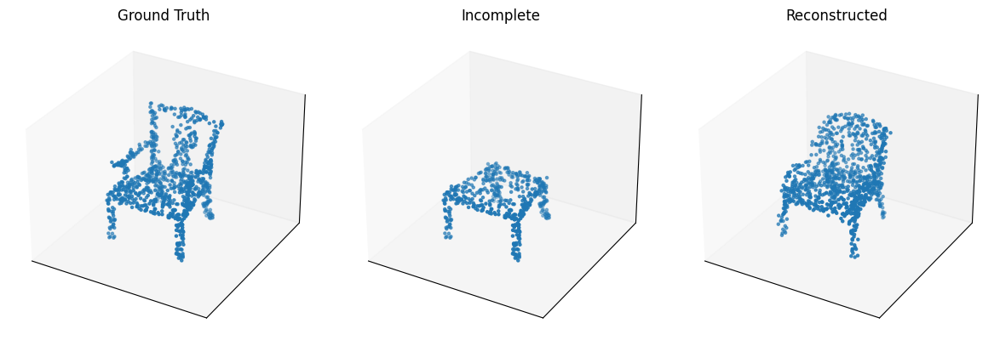

Epoch [100/100], Loss: 0.0720


In [ ]:
from tqdm.notebook import tqdm

num_epochs = 100
train_loss = []
test_losses = []

removed_points = 0.5
kept_points = int(1024 * removed_points)

for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    loop = tqdm(train_loader, desc=f"Epoch [{epoch+1}/{num_epochs}]")

    for point_cloud, _ in loop:
        point_cloud = point_cloud.to(device)
        B, N, _ = point_cloud.shape

        coords = point_cloud[:, :, 2]
        sort_idx = coords.argsort(dim=1)
        point_cloud_sorted = torch.gather(point_cloud, 1, sort_idx.unsqueeze(-1).expand(-1, -1, 3))

        point_cloud_partial = point_cloud_sorted[:, :kept_points, :]

        i=0

        reconstructed = model(point_cloud_partial)
        dist, assignment = criterion(reconstructed, point_cloud, EMD_EPS, EMD_ITERS)
        loss = torch.sqrt(dist).mean()



        ''' gt_np = point_cloud[i].cpu().numpy()
        partial_np = point_cloud_partial[i].cpu().numpy()
        recon_np = reconstructed[i].detach().cpu().numpy()
        visualize_reconstruction(gt_np, partial_np, recon_np) '''

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()

        total_loss += loss.item()
    avg_train_loss = total_loss / len(train_loader)
    train_loss.append(avg_train_loss)

    model.eval()
    total_test_loss = 0

    with torch.no_grad():
        for point_cloud, _ in test_loader:
            point_cloud = point_cloud.to(device)

            B, N, _ = point_cloud.shape

            coords = point_cloud[:, :, 2]
            sort_idx = coords.argsort(dim=1)
            point_cloud_sorted = torch.gather(point_cloud, 1, sort_idx.unsqueeze(-1).expand(-1, -1, 3))

            point_cloud_partial = point_cloud_sorted[:, :kept_points, :]

            reconstructed = model(point_cloud_partial)
            dist, assignment = criterion(reconstructed, point_cloud, EMD_EPS, EMD_ITERS)
            loss = torch.sqrt(dist).mean()
            total_test_loss += loss.item()

            i = 15
            gt_np = point_cloud[i].cpu().numpy()
            partial_np = point_cloud_partial[i].cpu().numpy()
            recon_np = reconstructed[i].cpu().numpy()
            visualize_reconstruction(gt_np, partial_np, recon_np)
            break
    avg_test_loss = total_test_loss / len(test_loader)
    test_losses.append(avg_test_loss)
    scheduler.step(avg_test_loss)

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {total_loss / len(train_loader):.4f}")


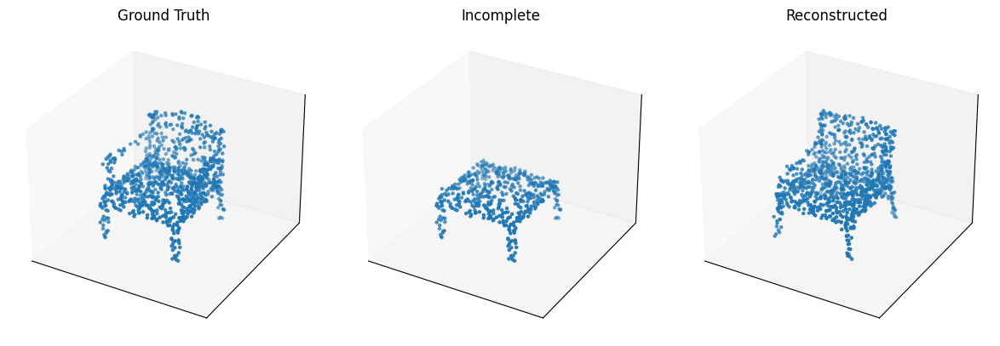

In [ ]:
with torch.no_grad():
  for point_cloud, _ in test_loader:
      point_cloud = point_cloud.to(device)

      B, N, _ = point_cloud.shape

      coords = point_cloud[:, :, 2]
      sort_idx = coords.argsort(dim=1)
      point_cloud_sorted = torch.gather(point_cloud, 1, sort_idx.unsqueeze(-1).expand(-1, -1, 3))

      #idx = torch.randperm(N)[:kept_points]
      point_cloud_partial = point_cloud_sorted[:, :kept_points, :]

      reconstructed = model(point_cloud_partial)
      dist, assignment = criterion(reconstructed, point_cloud, EMD_EPS, EMD_ITERS)
      loss = torch.sqrt(dist).mean()
      total_test_loss += loss.item()

      i = 24
      gt_np = point_cloud[i].cpu().numpy()
      partial_np = point_cloud_partial[i].cpu().numpy()
      recon_np = reconstructed[i].cpu().numpy()
      visualize_reconstruction(gt_np, partial_np, recon_np)
      break

In [ ]:
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 5))
plt.plot(train_loss, label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Test Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
!pip install open3d

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.7/447.7 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 65.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 23.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 74.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 66.7 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.10
    Uninstalling widgetsnbextension-3.6.10:
      Successfully uninstalled widgetsnbextension-3.6.10
  Attempting uninstall: werkzeug
    Found existing installation: Werkzeug 3.1.3
    Uninstalling Werkzeug-3.1.3:
      Successfully uninstalled Werkzeug-3.1.3
  Attempting uninstall: flask
    Found existing installation: Flask 3.1.0
    Unin

In [ ]:
import torch.optim as optim

print("Creating PointNet Model")
model = MinimalPointNet(num_classes=10)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.00025)

""" def init_weights(m):
    if isinstance(m, nn.Conv1d) or isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None:
            nn.init.constant_(m.bias, 0)
model.apply(init_weights) """
def init_weights(m):
    if isinstance(m, (nn.Conv1d, nn.Linear)):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None:
            nn.init.constant_(m.bias, 0)

model.apply(init_weights)

Starting training...


Epoch [1/20]: 100%|██████████| 63/63 [00:27<00:00,  2.32it/s, acc=57.8, loss=3.2]  


Epoch [1/20], Loss: 3.3236, Accuracy: 57.83%
Test Accuracy: 68.94%


Epoch [2/20]: 100%|██████████| 63/63 [00:26<00:00,  2.38it/s, acc=76.6, loss=1.47] 


Epoch [2/20], Loss: 1.3843, Accuracy: 76.65%
Test Accuracy: 83.81%


Epoch [3/20]: 100%|██████████| 63/63 [00:26<00:00,  2.38it/s, acc=80.1, loss=4.13] 


Epoch [3/20], Loss: 1.1220, Accuracy: 80.06%
Test Accuracy: 87.56%


Epoch [4/20]: 100%|██████████| 63/63 [00:26<00:00,  2.41it/s, acc=82.9, loss=0.608]


Epoch [4/20], Loss: 0.8956, Accuracy: 82.89%
Test Accuracy: 87.00%


Epoch [5/20]: 100%|██████████| 63/63 [00:26<00:00,  2.40it/s, acc=85.7, loss=0.543]


Epoch [5/20], Loss: 0.7769, Accuracy: 85.72%
Test Accuracy: 88.33%


Epoch [6/20]: 100%|██████████| 63/63 [00:26<00:00,  2.41it/s, acc=86.6, loss=0.679]


Epoch [6/20], Loss: 0.6562, Accuracy: 86.59%
Test Accuracy: 88.11%


Epoch [7/20]: 100%|██████████| 63/63 [00:26<00:00,  2.41it/s, acc=87.2, loss=0.566]


Epoch [7/20], Loss: 0.5871, Accuracy: 87.17%
Test Accuracy: 88.77%


Epoch [8/20]: 100%|██████████| 63/63 [00:26<00:00,  2.40it/s, acc=89, loss=0.197]  


Epoch [8/20], Loss: 0.4379, Accuracy: 89.00%
Test Accuracy: 90.09%


Epoch [9/20]: 100%|██████████| 63/63 [00:26<00:00,  2.41it/s, acc=89.4, loss=0.61] 


Epoch [9/20], Loss: 0.4819, Accuracy: 89.35%
Test Accuracy: 89.32%


Epoch [10/20]: 100%|██████████| 63/63 [00:26<00:00,  2.41it/s, acc=89.8, loss=0.288]


Epoch [10/20], Loss: 0.4120, Accuracy: 89.83%
Test Accuracy: 89.43%


Epoch [11/20]: 100%|██████████| 63/63 [00:26<00:00,  2.40it/s, acc=89.9, loss=1.27] 


Epoch [11/20], Loss: 0.4198, Accuracy: 89.88%
Test Accuracy: 91.30%


Epoch [12/20]: 100%|██████████| 63/63 [00:26<00:00,  2.41it/s, acc=90.7, loss=0.421]


Epoch [12/20], Loss: 0.3772, Accuracy: 90.70%
Test Accuracy: 91.30%


Epoch [13/20]: 100%|██████████| 63/63 [00:26<00:00,  2.38it/s, acc=91.1, loss=0.0667]


Epoch [13/20], Loss: 0.3436, Accuracy: 91.05%
Test Accuracy: 91.63%


Epoch [14/20]: 100%|██████████| 63/63 [00:26<00:00,  2.41it/s, acc=91, loss=0.66]   


Epoch [14/20], Loss: 0.3258, Accuracy: 90.95%
Test Accuracy: 91.74%


Epoch [15/20]: 100%|██████████| 63/63 [00:26<00:00,  2.41it/s, acc=91.6, loss=0.923] 


Epoch [15/20], Loss: 0.3146, Accuracy: 91.56%
Test Accuracy: 90.20%


Epoch [16/20]: 100%|██████████| 63/63 [00:26<00:00,  2.42it/s, acc=92.1, loss=0.259] 


Epoch [16/20], Loss: 0.2923, Accuracy: 92.08%
Test Accuracy: 90.75%


Epoch [17/20]: 100%|██████████| 63/63 [00:26<00:00,  2.41it/s, acc=92.7, loss=0.162] 


Epoch [17/20], Loss: 0.2663, Accuracy: 92.73%
Test Accuracy: 89.65%


Epoch [18/20]: 100%|██████████| 63/63 [00:26<00:00,  2.41it/s, acc=92.8, loss=0.255] 


Epoch [18/20], Loss: 0.2494, Accuracy: 92.76%
Test Accuracy: 91.08%


Epoch [19/20]: 100%|██████████| 63/63 [00:26<00:00,  2.40it/s, acc=92.7, loss=0.311] 


Epoch [19/20], Loss: 0.2651, Accuracy: 92.73%
Test Accuracy: 90.20%


Epoch [20/20]: 100%|██████████| 63/63 [00:26<00:00,  2.42it/s, acc=92.8, loss=0.119] 


Epoch [20/20], Loss: 0.2425, Accuracy: 92.76%


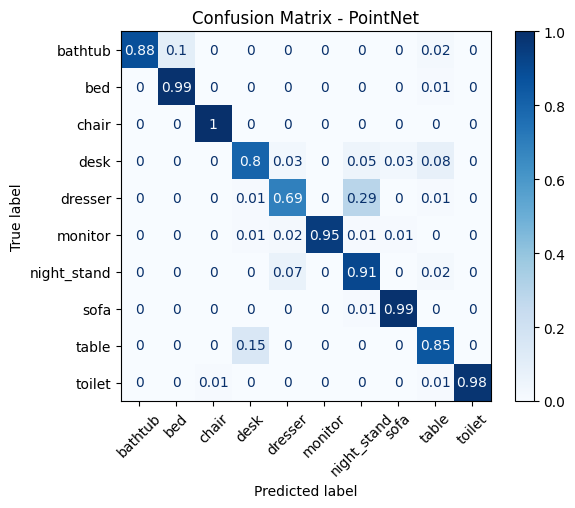

Test Accuracy: 90.97%


In [ ]:

import torch.nn as nn
import torch.utils.data as data
import torch
from tqdm import tqdm
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

train_acc = []
test_acc = []

train_loss = []
test_loss = []


print("Starting Classifyer training...")
num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    running_loss  = 0.0
    correct = 0
    total = 0

    """ loop = tqdm(train_loader, desc=f"Epoch [{epoch+1}/{num_epochs}]")
    print(loop)
    for point_cloud, labels in loop: """

    loop = tqdm(train_loader, desc=f"Epoch [{epoch+1}/{num_epochs}]")
    for point_cloud, labels in loop:
        if torch.cuda.is_available():
            point_cloud, labels = point_cloud.cuda(), labels.cuda()

        optimizer.zero_grad()

        outputs = model(point_cloud)

        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        running_loss += loss.item()

        loop.set_postfix(loss=loss.item(), acc=100 * correct / total)

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}, Accuracy: {100 * correct/total:.2f}%")
    train_acc.append(correct/total)
    train_loss.append(running_loss/len(train_loader))


    model.eval()
    test_correct = 0
    test_total = 0
    running_test_loss = 0.0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for point_clouds, labels in test_loader:
            if torch.cuda.is_available():
                point_clouds, labels = point_clouds.cuda(), labels.cuda()

            outputs = model(point_clouds)
            loss = criterion(outputs, labels)
            running_test_loss += loss.item()

            _, predicted = torch.max(outputs,1)
            test_total += labels.size(0)
            test_correct += (predicted == labels).sum().item()
            if epoch == num_epochs-1:

                all_preds.extend(predicted.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

    test_loss.append(running_test_loss / len(test_loader)
)

    if epoch == num_epochs-1 and len(all_preds) > 0:
        cm = confusion_matrix(all_labels, all_preds)
        cm_normalized = cm.astype('float') / cm.sum(axis=1, keepdims=True)
        cm_normalized = np.round(cm_normalized, decimals=2)

        classes = ['bathtub', "bed","chair", "desk", "dresser", "monitor", "night_stand", "sofa", "table", "toilet"]

        disp = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=classes)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=classes)
        disp.plot(xticks_rotation=45, cmap='Blues')
        plt.title("Confusion Matrix - PointNet")
        plt.show()

    test_accuracy = 100 * test_correct / test_total
    print(f"Test Accuracy: {test_accuracy:.2f}%")
    test_acc.append(test_correct/test_total)



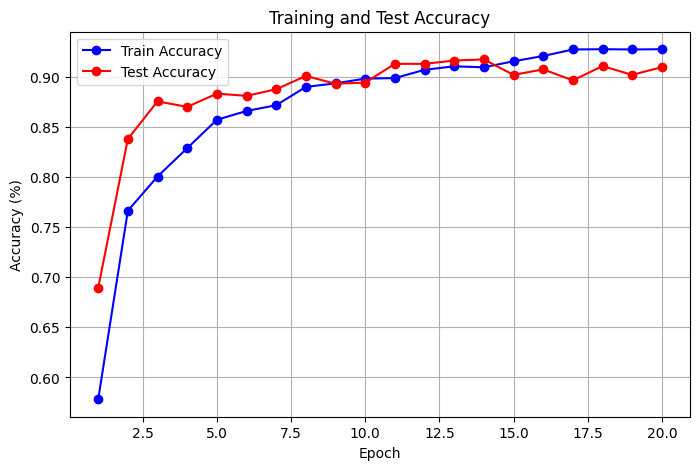

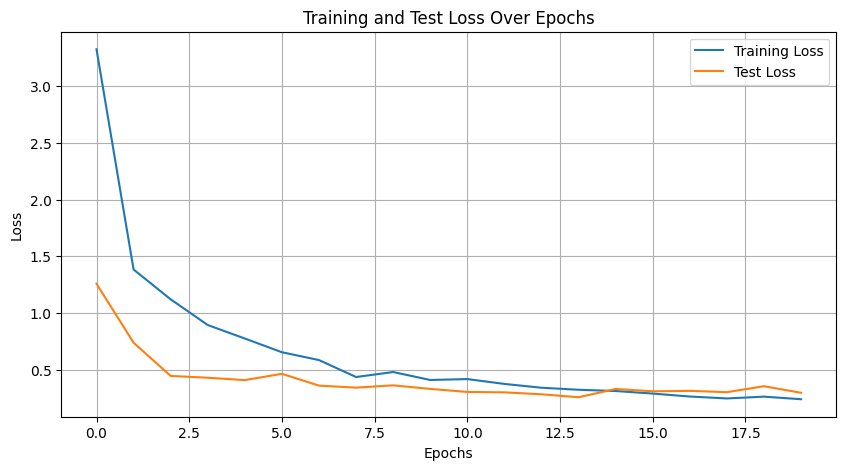

In [ ]:
import matplotlib.pyplot as plt

epochs = range(1, num_epochs + 1)
plt.figure(figsize=(8, 5))
plt.plot(epochs, train_acc, 'bo-', label='Train Accuracy')
plt.plot(epochs, test_acc, 'ro-', label='Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.title('Training and Test Accuracy')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(train_loss, label='Training Loss')
plt.plot(test_loss, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Test Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
import os
import trimesh
import numpy as np

class MinimalVoxNet(nn.Module):
    def __init__(self, num_classes=10, dropout_rate=0.5):
        super(MinimalVoxNet, self).__init__()
        self.conv1 = nn.Conv3d(1,32,kernel_size=5, stride=2)
        self.conv2 = nn.Conv3d(32,32,kernel_size=3)
        self.fc1 = nn.Linear(32*4*4*4,128)
        self.fc2 = nn.Linear(128, num_classes)
        self.dropout = nn.Dropout(p=dropout_rate)


    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x


class VoxelGridDataset(data.Dataset):
    def __init__(self, data_dir, mode, grid_size=16, pitch=0.2, num_points=1024):
        self.data_dir = data_dir
        self.grid_size = grid_size
        self.mode = mode
        self.pitch = pitch
        self.num_points = num_points
        self.classes = sorted([
            d for d in os.listdir(data_dir)
            if os.path.isdir(os.path.join(data_dir, d))
        ])

        self.data = []
        self.labels = []

        for label, class_name in enumerate(self.classes):
            print(label)
            class_dir = os.path.join(data_dir, class_name)
            if os.path.isdir(class_dir):
                mode_dir = os.path.join(class_dir, mode)
                for file in os.listdir(mode_dir):
                    if file.endswith('.off'):
                        file_path = os.path.join(mode_dir, file)
                        mesh = trimesh.load_mesh(file_path)

                        points = mesh.sample(num_points)

                        voxels = self._points_to_voxel_grid(points)

                        self.data.append(voxels)
                        self.labels.append(label)

    def _points_to_voxel_grid(self, points):
        """Convert sampled points into a binary voxel grid."""
        voxels = np.zeros((self.grid_size, self.grid_size, self.grid_size), dtype=np.float32)

        points_min = points.min(axis=0)
        points_max = points.max(axis=0)
        points_normalized = (points - points_min) / (points_max - points_min + 1e-8)
        points_scaled = points_normalized * (self.grid_size - 1)

        voxel_indices = np.floor(points_scaled).astype(int)

        for idx in voxel_indices:
            if (0 <= idx[0] < self.grid_size and
                0 <= idx[1] < self.grid_size and
                0 <= idx[2] < self.grid_size):
                voxels[idx[0], idx[1], idx[2]] = 1

        return voxels

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        voxel_grid = self.data[idx]
        label = self.labels[idx]
        voxel_grid = np.expand_dims(voxel_grid, axis=0)
        return torch.tensor(voxel_grid, dtype=torch.float32), torch.tensor(label)



In [ ]:
import torch.optim as optim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Creating VoxNet Model")
model = MinimalVoxNet(num_classes=10).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0005)

Creating VoxNet Model


In [ ]:
data_dir = 'ModelNet10'

print("Creating VoxNet Dataset and dataloader...")
train_dataset = VoxelGridDataset(data_dir, mode='train')
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32,shuffle=True)

test_dataset = VoxelGridDataset(data_dir, mode='test')
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=16,shuffle=True)

Creating VoxNet Dataset and dataloader...
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9


Starting training...


Epoch [1/20]: 100%|██████████| 125/125 [00:00<00:00, 203.30it/s, acc=57.3, loss=1.21]


Epoch [1/20], Loss: 1.2622, Accuracy: 57.33%
Test Accuracy: 77.31%


Epoch [2/20]: 100%|██████████| 125/125 [00:00<00:00, 186.05it/s, acc=81.3, loss=0.239]


Epoch [2/20], Loss: 0.5794, Accuracy: 81.31%
Test Accuracy: 78.96%


Epoch [3/20]: 100%|██████████| 125/125 [00:00<00:00, 178.42it/s, acc=85.5, loss=0.114]


Epoch [3/20], Loss: 0.4449, Accuracy: 85.54%
Test Accuracy: 82.38%


Epoch [4/20]: 100%|██████████| 125/125 [00:00<00:00, 176.87it/s, acc=87.4, loss=0.203]


Epoch [4/20], Loss: 0.3784, Accuracy: 87.37%
Test Accuracy: 84.03%


Epoch [5/20]: 100%|██████████| 125/125 [00:00<00:00, 188.56it/s, acc=88.9, loss=0.227]


Epoch [5/20], Loss: 0.3227, Accuracy: 88.93%
Test Accuracy: 84.47%


Epoch [6/20]: 100%|██████████| 125/125 [00:00<00:00, 203.47it/s, acc=89.7, loss=0.383]


Epoch [6/20], Loss: 0.3066, Accuracy: 89.73%
Test Accuracy: 84.91%


Epoch [7/20]: 100%|██████████| 125/125 [00:00<00:00, 204.49it/s, acc=90.3, loss=0.344]


Epoch [7/20], Loss: 0.2816, Accuracy: 90.30%
Test Accuracy: 86.23%


Epoch [8/20]: 100%|██████████| 125/125 [00:00<00:00, 203.23it/s, acc=91, loss=0.232]


Epoch [8/20], Loss: 0.2469, Accuracy: 91.00%
Test Accuracy: 85.57%


Epoch [9/20]: 100%|██████████| 125/125 [00:00<00:00, 206.88it/s, acc=91.8, loss=0.183]


Epoch [9/20], Loss: 0.2238, Accuracy: 91.78%
Test Accuracy: 85.57%


Epoch [10/20]: 100%|██████████| 125/125 [00:00<00:00, 205.57it/s, acc=92.8, loss=0.0859]


Epoch [10/20], Loss: 0.1981, Accuracy: 92.83%
Test Accuracy: 85.13%


Epoch [11/20]: 100%|██████████| 125/125 [00:00<00:00, 202.78it/s, acc=92.9, loss=0.245]


Epoch [11/20], Loss: 0.1958, Accuracy: 92.88%
Test Accuracy: 88.11%


Epoch [12/20]: 100%|██████████| 125/125 [00:00<00:00, 202.02it/s, acc=93, loss=0.209]


Epoch [12/20], Loss: 0.1850, Accuracy: 92.98%
Test Accuracy: 86.45%


Epoch [13/20]: 100%|██████████| 125/125 [00:00<00:00, 201.92it/s, acc=93.3, loss=0.206]


Epoch [13/20], Loss: 0.1836, Accuracy: 93.28%
Test Accuracy: 87.89%


Epoch [14/20]: 100%|██████████| 125/125 [00:00<00:00, 201.55it/s, acc=93.9, loss=0.0513]


Epoch [14/20], Loss: 0.1613, Accuracy: 93.89%
Test Accuracy: 86.89%


Epoch [15/20]: 100%|██████████| 125/125 [00:00<00:00, 201.26it/s, acc=93.5, loss=0.0853]


Epoch [15/20], Loss: 0.1626, Accuracy: 93.51%
Test Accuracy: 87.11%


Epoch [16/20]: 100%|██████████| 125/125 [00:00<00:00, 205.57it/s, acc=94, loss=0.163]


Epoch [16/20], Loss: 0.1582, Accuracy: 93.96%
Test Accuracy: 88.22%


Epoch [17/20]: 100%|██████████| 125/125 [00:00<00:00, 198.88it/s, acc=94.7, loss=0.0285]


Epoch [17/20], Loss: 0.1414, Accuracy: 94.71%
Test Accuracy: 86.89%


Epoch [18/20]: 100%|██████████| 125/125 [00:00<00:00, 202.38it/s, acc=94.9, loss=0.0622]


Epoch [18/20], Loss: 0.1286, Accuracy: 94.86%
Test Accuracy: 87.89%


Epoch [19/20]: 100%|██████████| 125/125 [00:00<00:00, 199.40it/s, acc=95, loss=0.0632]


Epoch [19/20], Loss: 0.1296, Accuracy: 94.99%
Test Accuracy: 86.89%


Epoch [20/20]: 100%|██████████| 125/125 [00:00<00:00, 177.62it/s, acc=95.3, loss=0.137]


Epoch [20/20], Loss: 0.1246, Accuracy: 95.26%


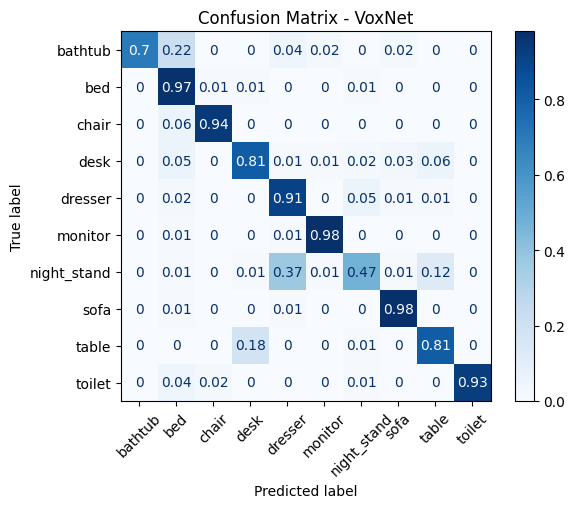

Test Accuracy: 86.34%


In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

import torch.nn as nn
import torch.utils.data as data
import torch
from tqdm import tqdm

train_acc = []
test_acc = []
train_loss = []
test_loss = []
all_preds = []
all_labels = []
print("Starting training...")
num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    running_loss  = 0.0
    correct = 0
    total = 0

    """ loop = tqdm(train_loader, desc=f"Epoch [{epoch+1}/{num_epochs}]")
    print(loop)
    for point_cloud, labels in loop: """

    loop = tqdm(train_loader, desc=f"Epoch [{epoch+1}/{num_epochs}]")
    for point_cloud, labels in loop:
        if torch.cuda.is_available():
            point_cloud, labels = point_cloud.cuda(), labels.cuda()

        optimizer.zero_grad()

        outputs = model(point_cloud)

        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        running_loss += loss.item()

        loop.set_postfix(loss=loss.item(), acc=100 * correct / total)

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}, Accuracy: {100 * correct/total:.2f}%")
    train_acc.append(correct/total)
    train_loss.append(running_loss/len(train_loader))


    model.eval()
    test_correct = 0
    test_total = 0
    running_test_loss = 0.0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for point_clouds, labels in test_loader:
            if torch.cuda.is_available():
                point_clouds, labels = point_clouds.cuda(), labels.cuda()

            outputs = model(point_clouds)
            loss = criterion(outputs, labels)
            running_test_loss += loss.item()
            _, predicted = torch.max(outputs,1)
            test_total += labels.size(0)
            test_correct += (predicted == labels).sum().item()
            if epoch == num_epochs-1:

                all_preds.extend(predicted.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
    test_loss.append(running_test_loss / len(test_loader))

    if epoch == num_epochs-1 and len(all_preds) > 0:
        cm = confusion_matrix(all_labels, all_preds)
        cm_normalized = cm.astype('float') / cm.sum(axis=1, keepdims=True)
        cm_normalized = np.round(cm_normalized, decimals=2)

        classes = ['bathtub', "bed","chair", "desk", "dresser", "monitor", "night_stand", "sofa", "table", "toilet"]

        disp = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=classes)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=classes)
        disp.plot(xticks_rotation=45, cmap='Blues')
        plt.title("Confusion Matrix - VoxNet")
        plt.show()

    test_accuracy = 100 * test_correct / test_total
    print(f"Test Accuracy: {test_accuracy:.2f}%")
    test_acc.append(test_correct/test_total)



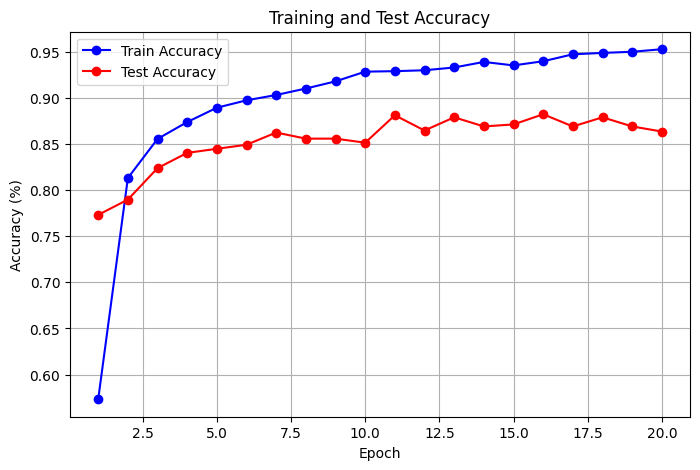

[0.7641584763401433, 0.6691124146444756, 0.540082114176792, 0.4971881827764344, 0.4810868793150835, 0.4761123967013861, 0.4483934621931168, 0.4273114732482977, 0.4650929154534089, 0.48117063638933916, 0.4019371001213266, 0.40513164896452636, 0.37709784112347844, 0.4254545569419861, 0.4041986961832695, 0.36335291785367746, 0.4317410343261272, 0.42138345101684854, 0.4201571876346542, 0.45155212255358174]


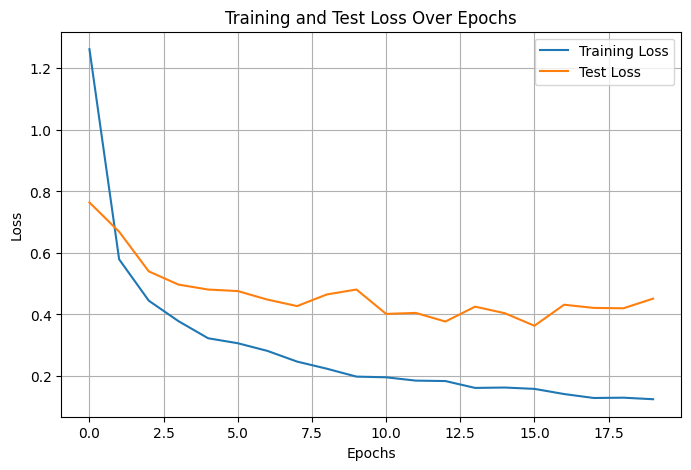

In [ ]:
import matplotlib.pyplot as plt

epochs = range(1, num_epochs + 1)
plt.figure(figsize=(8, 5))
plt.plot(epochs, train_acc, 'bo-', label='Train Accuracy')
plt.plot(epochs, test_acc, 'ro-', label='Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.title('Training and Test Accuracy')
plt.legend()
plt.grid(True)
plt.show()
print(test_loss)
plt.figure(figsize=(8, 5))
plt.plot(train_loss, label='Training Loss')
plt.plot(test_loss, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Test Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()